# Advanced: NIRISS Imaging Tutorial Notebook

## Table of Contents
1. [Introduction](#intro)
2. [Examining uncalibrated data products](#examine)
3. [Stage 1 Processing](#det1)
4. [Stage 2 Processing](#image2)
5. [Stage 3 Processing](#image3)
6. [Visualize Detected Sources](#detections)

Date published: January 24, 2024

## <a id='intro'>1. Introduction</a>
In this notebook, we will process a [NIRISS imaging dataset](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-observing-modes/niriss-imaging) through the [JWST calibration pipeline](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview). The example dataset is from [Program ID](https://www.stsci.edu/jwst/science-execution/program-information) 1475 (PI: Boyer, CoI: Volk) which is a sky flat calibration program. NIRCam is used as the primary instrument with NIRISS as a [coordinated parallel instrument](https://jwst-docs.stsci.edu/methods-and-roadmaps/jwst-parallel-observations/jwst-coordinated-parallels-roadmap). The NIRISS imaging dataset uses a 17-step dither pattern.

For illustrative purposes, we focus on data taken through the NIRISS [F150W filter](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-instrumentation/niriss-filters) and start with uncalibrated data products. The files are named
`jw01475006001_02201_000nn_nis_uncal.fits`, where *nn* refers to the dither step number which ranges from 01 - 17. See the ["File Naming Schemes" documentation](https://jwst-pipeline.readthedocs.io/en/stable/jwst/data_products/file_naming.html) to learn more about the file naming convention.

In this notebook, we assume all uncalibrated fits files are saved in a directory named `1475_f150w`.

### Install pipeline and dependencies

To make sure that the pipeline version is compatabile with the steps discussed below and the required dependencies and packages are installed, you can create a fresh conda environment and install the provided `requirements.txt` file:
```
conda create -n niriss_imaging_pipeline python=3.11
conda activate niriss_imaging_pipeline
pip install -r requirements.txt
```

### Imports

In [1]:
import os
import glob
import zipfile
import numpy as np
import urllib.request
from IPython.display import Image

# For visualizing images
import jdaviz
from jdaviz import Imviz

# Astropy routines for visualizing detected sources:
from astropy.table import Table
from astropy.coordinates import SkyCoord

# Configure CRDS
os.environ["CRDS_PATH"] = 'crds_cache'
os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"

# for JWST calibration pipeline
import jwst
from jwst import datamodels
from jwst.pipeline import Detector1Pipeline, Image2Pipeline, Image3Pipeline
from jwst.associations import asn_from_list
from jwst.associations.lib.rules_level3_base import DMS_Level3_Base

# To confirm which version of the pipeline you're running:
print(f"jwst pipeline version: {jwst.__version__}")
print(f"jdaviz version: {jdaviz.__version__}")

jwst pipeline version: 1.16.0
jdaviz version: 3.10.3


### Download uncalibrated data products

In [2]:
# APT program ID number:
pid = '01475'

# Set up directory to download uncalibrated data files:
data_dir = '1475_f150w/'
# Create directory if it does not exist
if not os.path.isdir(data_dir):
    os.mkdir(data_dir)

# Download uncalibrated data from Box into current directory:
boxlink = 'https://data.science.stsci.edu/redirect/JWST/jwst-data_analysis_tools/niriss_imaging/1475_f150w.zip'
boxfile = os.path.join(data_dir, '1475_f150w.zip')
urllib.request.urlretrieve(boxlink, boxfile)

zf = zipfile.ZipFile(boxfile, 'r')
zf.extractall()

***
## <a id='examine'>2. Examining uncalibrated data products</a>

In [3]:
uncal_files = sorted(glob.glob(os.path.join(data_dir, '*_uncal.fits')))

### Look at the first file to determine exposure parameters and practice using JWST datamodels

In [4]:
# print file name
print(uncal_files[0])

# Open file as JWST datamodel
examine = datamodels.open(uncal_files[0])

# Print out exposure info
print("Instrument: " + examine.meta.instrument.name)
print("Filter: " + examine.meta.instrument.filter)
print("Pupil: " + examine.meta.instrument.pupil)
print("Number of integrations: {}".format(examine.meta.exposure.nints))
print("Number of groups: {}".format(examine.meta.exposure.ngroups))
print("Readout pattern: " + examine.meta.exposure.readpatt)
print("Dither position number: {}".format(examine.meta.dither.position_number))
print("\n")

1475_f150w/jw01475006001_02201_00001_nis_uncal.fits


Instrument: NIRISS
Filter: CLEAR
Pupil: F150W
Number of integrations: 1
Number of groups: 16
Readout pattern: NIS
Dither position number: 1




From the above, we confirm that the data file is for the NIRISS instrument using the `F150W` filter in the [Pupil Wheel](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-instrumentation/niriss-pupil-and-filter-wheels) crossed with the `CLEAR` filter in the Filter Wheel. This observation uses the [`NIS` readout pattern](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-instrumentation/niriss-detector-overview/niriss-detector-readout-patterns), 16 groups per integration, and 1 integration per exposure. This data file is the 1st dither position in this exposure sequence. For more information about how JWST exposures are defined by up-the-ramp sampling, see the [Understanding Exposure Times JDox article](https://jwst-docs.stsci.edu/understanding-exposure-times).

This metadata will be the same for all exposures in this observation other than the dither position number.

### Display uncalibrated image

We can visualize an uncalibrated dataset that will show detector artifacts that will be removed when calibrating the data through the `DETECTOR1` stage of the pipeline. Uncalibrated data files thus are 4D: nintegrations x ngroups x nrows x ncols. Here, we are visualizing the full detector (i.e., all columns and rows) and the 1st group.

We are using the [Imviz tool](https://jdaviz.readthedocs.io/en/latest/imviz/index.html) within the `jdaviz` package to visualize the NIRISS image.

In [5]:
# Create an Imviz instance and set up default viewer
imviz_uncal = Imviz()
viewer_uncal = imviz_uncal.default_viewer

# Read in the science array for our visualization dataset:
uncal_science = examine.data

# Load the dataset into Imviz
imviz_uncal.load_data(uncal_science[0, 0, :, :])

# Visualize the dataset:
imviz_uncal.show()

Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.3/imviz/index.html', events=['ca…

Adjust settings for the viewer:

In [6]:
plotopt = imviz_uncal.plugins['Plot Options']
plotopt.stretch_function = 'sqrt'
plotopt.image_colormap = 'Viridis'
plotopt.stretch_preset = '99.5%'
plotopt.zoom_radius = 1024

The viewer looks like this:

In [7]:
viewer_uncal.save('./uncal_science.png')

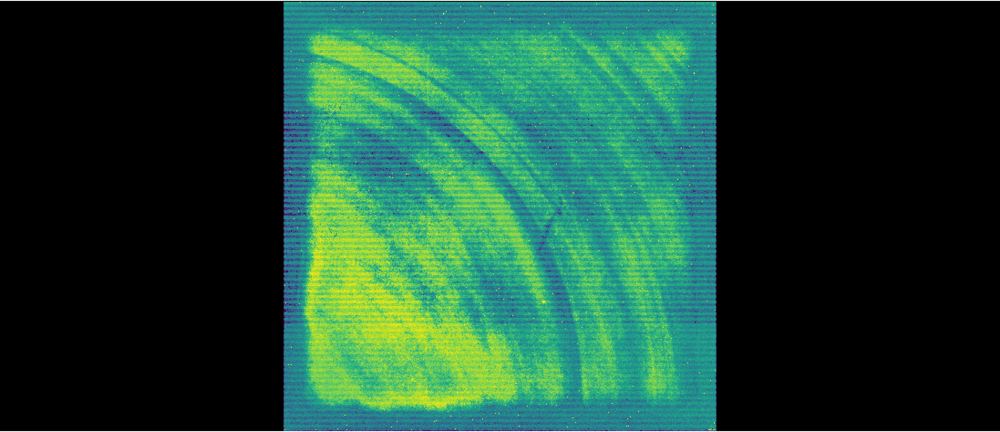

In [8]:
Image('./uncal_science.png')

***
## <a id='det1'>3. Stage 1 Processing </a>
Run the datasets through the [Detector1 stage of the pipeline](https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline-overview/stages-of-jwst-data-processing/calwebb_detector1) to apply detector level calibrations and create a countrate data product where slopes are fitted to the integration ramps. These `*_rate.fits` products are 2D (nrows x ncols), averaged over all integrations. 3D countrate data products (`*_rateints.fits`) are also created (nintegrations x nrows x ncols) which have the fitted ramp slopes for each integration.

The [pipeline documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/running_pipeline_python.html) discusses how to run the pipeline in the Python Interface, including how to configure pipeline steps and override reference files. By returning the results of the pipeline to a variable, the pipeline returns a datamodel. Note that the [`pipeline.call()` method is preferred over the `pipeline.run()` method](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/running_pipeline_python.html#advanced-use-pipeline-run-vs-pipeline-call).

By default, [all steps in the Detector1 stage of the pipeline](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_detector1.html) are run for NIRISS except: the `ipc` correction step and the `gain_scale` step. Note that while the [`persistence` step](https://jwst-pipeline.readthedocs.io/en/latest/jwst/persistence/description.html) is set to run by default, this step does not automatically correct the science data for persistence. The `persistence` step creates a `*_trapsfilled.fits` file which is a model that records the number of traps filled at each pixel at the end of an exposure. This file would be used as an input to the `persistence` step, via the `input_trapsfilled` argument, to correct a science exposure for persistence. Since persistence is not well calibrated for NIRISS, we do not perform a persistence correction and thus turn off this step to speed up calibration and to not create files that will not be used in the subsequent analysis. This step can be turned off when running the pipeline in Python by doing:
```
rate_result = Detector1Pipeline.call(uncal,
                                     steps={'persistence': {'skip': True}})
```

The [charge_migration step](https://jwst-pipeline.readthedocs.io/en/latest/jwst/charge_migration/index.html#charge-migration-step) is particularly important for NIRISS images to mitigate apparent flux loss in resampled images due to the spilling of charge from a central pixel into its neighboring pixels (see [Goudfrooij et al. 2023](https://ui.adsabs.harvard.edu/abs/2023arXiv231116301G/abstract) for details). Charge migration occurs when the accumulated charge in a central pixel exceeds a certain signal limit, which is ~25,000 ADU. This step is turned on by default for NIRISS imaging, Wide Field Slitless Spectroscopy [(WFSS)](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-observing-modes/niriss-wide-field-slitless-spectroscopy), and Aperture Masking Interferometry [(AMI)](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-observing-modes/niriss-aperture-masking-interferometry) modes when using CRDS contexts of `jwst_1159.pmap` or later. Different signal limits for each filter are provided by the [pars-chargemigrationstep parameter files](https://jwst-crds.stsci.edu). Users can specify a different signal limit by running this step with the `signal_threshold` flag and entering another signal limit in units of ADU.

As of CRDS context `jwst_1155.pmap` and later, the [`jump` step](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.jump.JumpStep.html) of the `DETECTOR1` stage of the pipeline will remove residuals associated with [snowballs](https://jwst-docs.stsci.edu/data-artifacts-and-features/snowballs-and-shower-artifacts) for NIRISS imaging, WFSS, and AMI modes. The default parameters for this correction, where `expand_large_events` set to `True` turns on the snowball halo removal algorithm, are specified in the `pars-jumpstep` parameter reference files. Users may wish to alter parameters to optimize removal of snowball residuals. Available parameters are discussed in the [Detection and Flagging of Showers and Snowballs in JWST Technical Report (Regan 2023)](https://www.stsci.edu/files/live/sites/www/files/home/jwst/documentation/technical-documents/_documents/JWST-STScI-008545.pdf).

In [9]:
# Define directory to save output from detector1
det1_dir = 'detector1/'
# Create directory if it does not exist
if not os.path.isdir(det1_dir):
    os.mkdir(det1_dir)

# Run Detector1 stage of pipeline, specifying:
# output directory to save *_rate.fits files
# save_results flag set to True so the rate files are saved
# skipping the persistence step
    
for uncal in uncal_files:
    rate_result = Detector1Pipeline.call(uncal,
                                         output_dir=det1_dir,
                                         save_results=True,
                                         steps={'persistence': {'skip': True}})

2024-09-23 16:35:03,017 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_datalvl_0002.rmap       694 bytes  (1 / 199 files) (0 / 716.3 K bytes)


2024-09-23 16:35:03,348 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_calver_0038.rmap      4.8 K bytes  (2 / 199 files) (694 / 716.3 K bytes)


2024-09-23 16:35:03,601 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_0037.imap               385 bytes  (3 / 199 files) (5.5 K / 716.3 K bytes)


2024-09-23 16:35:03,861 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavelengthrange_0024.rmap    1.4 K bytes  (4 / 199 files) (5.9 K / 716.3 K bytes)


2024-09-23 16:35:04,117 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavecorr_0005.rmap      884 bytes  (5 / 199 files) (7.3 K / 716.3 K bytes)


2024-09-23 16:35:04,455 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_superbias_0074.rmap   33.8 K bytes  (6 / 199 files) (8.2 K / 716.3 K bytes)


2024-09-23 16:35:04,853 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_sflat_0026.rmap     20.6 K bytes  (7 / 199 files) (41.9 K / 716.3 K bytes)


2024-09-23 16:35:05,272 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_saturation_0018.rmap    2.0 K bytes  (8 / 199 files) (62.5 K / 716.3 K bytes)


2024-09-23 16:35:05,518 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_refpix_0015.rmap     1.6 K bytes  (9 / 199 files) (64.5 K / 716.3 K bytes)


2024-09-23 16:35:05,779 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_readnoise_0025.rmap    2.6 K bytes  (10 / 199 files) (66.1 K / 716.3 K bytes)


2024-09-23 16:35:06,030 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_photom_0013.rmap       958 bytes  (11 / 199 files) (68.7 K / 716.3 K bytes)


2024-09-23 16:35:06,366 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pathloss_0007.rmap    1.1 K bytes  (12 / 199 files) (69.6 K / 716.3 K bytes)


2024-09-23 16:35:06,612 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-whitelightstep_0001.rmap      777 bytes  (13 / 199 files) (70.8 K / 716.3 K bytes)


2024-09-23 16:35:06,859 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-spec2pipeline_0013.rmap    2.1 K bytes  (14 / 199 files) (71.5 K / 716.3 K bytes)


2024-09-23 16:35:07,099 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-resamplespecstep_0002.rmap      709 bytes  (15 / 199 files) (73.6 K / 716.3 K bytes)


2024-09-23 16:35:07,337 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-outlierdetectionstep_0002.rmap      852 bytes  (16 / 199 files) (74.4 K / 716.3 K bytes)


2024-09-23 16:35:07,594 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-jumpstep_0005.rmap      810 bytes  (17 / 199 files) (75.2 K / 716.3 K bytes)


2024-09-23 16:35:07,858 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-image2pipeline_0008.rmap    1.0 K bytes  (18 / 199 files) (76.0 K / 716.3 K bytes)


2024-09-23 16:35:08,100 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-detector1pipeline_0003.rmap    1.1 K bytes  (19 / 199 files) (77.0 K / 716.3 K bytes)


2024-09-23 16:35:08,363 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-darkpipeline_0003.rmap      872 bytes  (20 / 199 files) (78.1 K / 716.3 K bytes)


2024-09-23 16:35:08,615 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-darkcurrentstep_0001.rmap      622 bytes  (21 / 199 files) (78.9 K / 716.3 K bytes)


2024-09-23 16:35:08,850 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ote_0030.rmap        1.3 K bytes  (22 / 199 files) (79.6 K / 716.3 K bytes)


2024-09-23 16:35:09,109 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msaoper_0014.rmap    1.4 K bytes  (23 / 199 files) (80.8 K / 716.3 K bytes)


2024-09-23 16:35:09,363 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msa_0027.rmap        1.3 K bytes  (24 / 199 files) (82.3 K / 716.3 K bytes)


2024-09-23 16:35:09,604 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_mask_0039.rmap       2.7 K bytes  (25 / 199 files) (83.5 K / 716.3 K bytes)


2024-09-23 16:35:09,935 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_linearity_0017.rmap    1.6 K bytes  (26 / 199 files) (86.2 K / 716.3 K bytes)


2024-09-23 16:35:10,182 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ipc_0006.rmap          876 bytes  (27 / 199 files) (87.8 K / 716.3 K bytes)


2024-09-23 16:35:10,510 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifuslicer_0017.rmap    1.5 K bytes  (28 / 199 files) (88.6 K / 716.3 K bytes)


2024-09-23 16:35:10,840 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifupost_0019.rmap    1.5 K bytes  (29 / 199 files) (90.2 K / 716.3 K bytes)


2024-09-23 16:35:11,174 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifufore_0017.rmap    1.5 K bytes  (30 / 199 files) (91.7 K / 716.3 K bytes)


2024-09-23 16:35:11,418 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_gain_0023.rmap       1.8 K bytes  (31 / 199 files) (93.2 K / 716.3 K bytes)


2024-09-23 16:35:11,684 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fpa_0028.rmap        1.3 K bytes  (32 / 199 files) (94.9 K / 716.3 K bytes)


2024-09-23 16:35:12,016 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fore_0026.rmap       5.0 K bytes  (33 / 199 files) (96.2 K / 716.3 K bytes)


2024-09-23 16:35:12,270 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_flat_0015.rmap       3.8 K bytes  (34 / 199 files) (101.1 K / 716.3 K bytes)


2024-09-23 16:35:12,527 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fflat_0024.rmap      7.2 K bytes  (35 / 199 files) (105.0 K / 716.3 K bytes)


2024-09-23 16:35:12,773 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_extract1d_0018.rmap    2.3 K bytes  (36 / 199 files) (112.2 K / 716.3 K bytes)


2024-09-23 16:35:13,034 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_disperser_0028.rmap    5.7 K bytes  (37 / 199 files) (114.5 K / 716.3 K bytes)


2024-09-23 16:35:13,364 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dflat_0007.rmap      1.1 K bytes  (38 / 199 files) (120.2 K / 716.3 K bytes)


2024-09-23 16:35:13,615 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dark_0069.rmap      32.6 K bytes  (39 / 199 files) (121.3 K / 716.3 K bytes)


2024-09-23 16:35:13,999 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_cubepar_0015.rmap      966 bytes  (40 / 199 files) (153.9 K / 716.3 K bytes)


2024-09-23 16:35:14,259 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_collimator_0026.rmap    1.3 K bytes  (41 / 199 files) (154.9 K / 716.3 K bytes)


2024-09-23 16:35:14,507 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_camera_0026.rmap     1.3 K bytes  (42 / 199 files) (156.2 K / 716.3 K bytes)


2024-09-23 16:35:14,765 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_barshadow_0007.rmap    1.8 K bytes  (43 / 199 files) (157.5 K / 716.3 K bytes)


2024-09-23 16:35:15,009 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_area_0018.rmap       6.3 K bytes  (44 / 199 files) (159.3 K / 716.3 K bytes)


2024-09-23 16:35:15,274 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_apcorr_0009.rmap     5.6 K bytes  (45 / 199 files) (165.5 K / 716.3 K bytes)


2024-09-23 16:35:15,513 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_0379.imap            5.6 K bytes  (46 / 199 files) (171.1 K / 716.3 K bytes)


2024-09-23 16:35:15,782 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wfssbkg_0007.rmap     3.1 K bytes  (47 / 199 files) (176.7 K / 716.3 K bytes)


2024-09-23 16:35:16,113 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavemap_0008.rmap     2.2 K bytes  (48 / 199 files) (179.8 K / 716.3 K bytes)


2024-09-23 16:35:16,362 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavelengthrange_0006.rmap      862 bytes  (49 / 199 files) (182.0 K / 716.3 K bytes)


2024-09-23 16:35:16,610 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trappars_0004.rmap      753 bytes  (50 / 199 files) (182.9 K / 716.3 K bytes)


2024-09-23 16:35:16,862 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trapdensity_0005.rmap      705 bytes  (51 / 199 files) (183.7 K / 716.3 K bytes)


2024-09-23 16:35:17,111 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_throughput_0005.rmap    1.3 K bytes  (52 / 199 files) (184.4 K / 716.3 K bytes)


2024-09-23 16:35:17,355 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_superbias_0028.rmap    6.5 K bytes  (53 / 199 files) (185.6 K / 716.3 K bytes)


2024-09-23 16:35:17,619 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specwcs_0014.rmap     3.1 K bytes  (54 / 199 files) (192.1 K / 716.3 K bytes)


2024-09-23 16:35:17,869 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_spectrace_0008.rmap    2.3 K bytes  (55 / 199 files) (195.2 K / 716.3 K bytes)


2024-09-23 16:35:18,209 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specprofile_0008.rmap    2.4 K bytes  (56 / 199 files) (197.6 K / 716.3 K bytes)


2024-09-23 16:35:18,452 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_speckernel_0006.rmap    1.0 K bytes  (57 / 199 files) (199.9 K / 716.3 K bytes)


2024-09-23 16:35:18,779 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_saturation_0015.rmap      829 bytes  (58 / 199 files) (201.0 K / 716.3 K bytes)


2024-09-23 16:35:19,031 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_readnoise_0011.rmap      987 bytes  (59 / 199 files) (201.8 K / 716.3 K bytes)


2024-09-23 16:35:19,336 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_photom_0035.rmap      1.3 K bytes  (60 / 199 files) (202.8 K / 716.3 K bytes)


2024-09-23 16:35:19,592 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_persat_0007.rmap        674 bytes  (61 / 199 files) (204.0 K / 716.3 K bytes)


2024-09-23 16:35:19,851 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pathloss_0003.rmap      758 bytes  (62 / 199 files) (204.7 K / 716.3 K bytes)


2024-09-23 16:35:20,107 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-undersamplecorrectionstep_0001.rmap      904 bytes  (63 / 199 files) (205.5 K / 716.3 K bytes)


2024-09-23 16:35:20,347 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-tweakregstep_0012.rmap    3.1 K bytes  (64 / 199 files) (206.4 K / 716.3 K bytes)


2024-09-23 16:35:20,588 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-spec2pipeline_0008.rmap      984 bytes  (65 / 199 files) (209.5 K / 716.3 K bytes)


2024-09-23 16:35:20,850 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-sourcecatalogstep_0002.rmap    2.3 K bytes  (66 / 199 files) (210.5 K / 716.3 K bytes)


2024-09-23 16:35:21,090 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-resamplestep_0002.rmap      687 bytes  (67 / 199 files) (212.8 K / 716.3 K bytes)


2024-09-23 16:35:21,420 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-outlierdetectionstep_0004.rmap    2.7 K bytes  (68 / 199 files) (213.5 K / 716.3 K bytes)


2024-09-23 16:35:21,686 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-jumpstep_0007.rmap    6.4 K bytes  (69 / 199 files) (216.1 K / 716.3 K bytes)


2024-09-23 16:35:21,925 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-image2pipeline_0005.rmap    1.0 K bytes  (70 / 199 files) (222.5 K / 716.3 K bytes)


2024-09-23 16:35:22,186 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-detector1pipeline_0002.rmap    1.0 K bytes  (71 / 199 files) (223.5 K / 716.3 K bytes)


2024-09-23 16:35:22,423 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-darkpipeline_0002.rmap      868 bytes  (72 / 199 files) (224.6 K / 716.3 K bytes)


2024-09-23 16:35:22,664 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-darkcurrentstep_0001.rmap      591 bytes  (73 / 199 files) (225.4 K / 716.3 K bytes)


2024-09-23 16:35:22,910 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-chargemigrationstep_0004.rmap    5.7 K bytes  (74 / 199 files) (226.0 K / 716.3 K bytes)


2024-09-23 16:35:23,170 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_nrm_0002.rmap           663 bytes  (75 / 199 files) (231.7 K / 716.3 K bytes)


2024-09-23 16:35:23,423 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_mask_0020.rmap          859 bytes  (76 / 199 files) (232.3 K / 716.3 K bytes)


2024-09-23 16:35:23,671 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_linearity_0022.rmap      961 bytes  (77 / 199 files) (233.2 K / 716.3 K bytes)


2024-09-23 16:35:23,926 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_ipc_0007.rmap           651 bytes  (78 / 199 files) (234.2 K / 716.3 K bytes)


2024-09-23 16:35:24,175 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_gain_0011.rmap          797 bytes  (79 / 199 files) (234.8 K / 716.3 K bytes)


2024-09-23 16:35:24,414 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_flat_0023.rmap        5.9 K bytes  (80 / 199 files) (235.6 K / 716.3 K bytes)


2024-09-23 16:35:24,661 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_filteroffset_0010.rmap      853 bytes  (81 / 199 files) (241.5 K / 716.3 K bytes)


2024-09-23 16:35:24,901 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_extract1d_0007.rmap      905 bytes  (82 / 199 files) (242.3 K / 716.3 K bytes)


2024-09-23 16:35:25,165 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_drizpars_0004.rmap      519 bytes  (83 / 199 files) (243.2 K / 716.3 K bytes)


2024-09-23 16:35:25,406 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_distortion_0025.rmap    3.4 K bytes  (84 / 199 files) (243.8 K / 716.3 K bytes)


2024-09-23 16:35:25,737 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_dark_0031.rmap        6.8 K bytes  (85 / 199 files) (247.2 K / 716.3 K bytes)


2024-09-23 16:35:26,066 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_area_0014.rmap        2.7 K bytes  (86 / 199 files) (254.0 K / 716.3 K bytes)


2024-09-23 16:35:26,398 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_apcorr_0010.rmap      4.3 K bytes  (87 / 199 files) (256.7 K / 716.3 K bytes)


2024-09-23 16:35:26,661 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_abvegaoffset_0004.rmap    1.4 K bytes  (88 / 199 files) (261.0 K / 716.3 K bytes)


2024-09-23 16:35:26,924 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_0256.imap             5.6 K bytes  (89 / 199 files) (262.3 K / 716.3 K bytes)


2024-09-23 16:35:27,516 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wfssbkg_0004.rmap     7.2 K bytes  (90 / 199 files) (268.0 K / 716.3 K bytes)


2024-09-23 16:35:27,755 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wavelengthrange_0010.rmap      996 bytes  (91 / 199 files) (275.2 K / 716.3 K bytes)


2024-09-23 16:35:28,001 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_tsophot_0003.rmap       896 bytes  (92 / 199 files) (276.2 K / 716.3 K bytes)


2024-09-23 16:35:28,243 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trappars_0003.rmap    1.6 K bytes  (93 / 199 files) (277.0 K / 716.3 K bytes)


2024-09-23 16:35:28,476 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trapdensity_0003.rmap    1.6 K bytes  (94 / 199 files) (278.6 K / 716.3 K bytes)


2024-09-23 16:35:28,728 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_superbias_0017.rmap   16.1 K bytes  (95 / 199 files) (280.3 K / 716.3 K bytes)


2024-09-23 16:35:29,034 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_specwcs_0022.rmap     7.1 K bytes  (96 / 199 files) (296.3 K / 716.3 K bytes)


2024-09-23 16:35:29,362 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_saturation_0010.rmap    2.2 K bytes  (97 / 199 files) (303.4 K / 716.3 K bytes)


2024-09-23 16:35:29,604 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_readnoise_0024.rmap   23.1 K bytes  (98 / 199 files) (305.6 K / 716.3 K bytes)


2024-09-23 16:35:29,930 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_psfmask_0008.rmap    28.4 K bytes  (99 / 199 files) (328.7 K / 716.3 K bytes)


2024-09-23 16:35:30,275 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_photom_0028.rmap      3.4 K bytes  (100 / 199 files) (357.0 K / 716.3 K bytes)


2024-09-23 16:35:30,511 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_persat_0005.rmap      1.6 K bytes  (101 / 199 files) (360.4 K / 716.3 K bytes)


2024-09-23 16:35:30,770 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-whitelightstep_0003.rmap    1.5 K bytes  (102 / 199 files) (361.9 K / 716.3 K bytes)


2024-09-23 16:35:31,007 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-tweakregstep_0003.rmap    4.5 K bytes  (103 / 199 files) (363.4 K / 716.3 K bytes)


2024-09-23 16:35:31,242 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-spec2pipeline_0008.rmap      984 bytes  (104 / 199 files) (367.9 K / 716.3 K bytes)


2024-09-23 16:35:31,496 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-sourcecatalogstep_0002.rmap    4.6 K bytes  (105 / 199 files) (368.9 K / 716.3 K bytes)


2024-09-23 16:35:31,728 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-resamplestep_0002.rmap      687 bytes  (106 / 199 files) (373.5 K / 716.3 K bytes)


2024-09-23 16:35:31,983 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-outlierdetectionstep_0003.rmap      940 bytes  (107 / 199 files) (374.2 K / 716.3 K bytes)


2024-09-23 16:35:32,249 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-jumpstep_0005.rmap      806 bytes  (108 / 199 files) (375.1 K / 716.3 K bytes)


2024-09-23 16:35:32,500 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-image2pipeline_0003.rmap    1.0 K bytes  (109 / 199 files) (375.9 K / 716.3 K bytes)


2024-09-23 16:35:32,760 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-detector1pipeline_0003.rmap    1.0 K bytes  (110 / 199 files) (377.0 K / 716.3 K bytes)


2024-09-23 16:35:33,021 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-darkpipeline_0002.rmap      868 bytes  (111 / 199 files) (378.0 K / 716.3 K bytes)


2024-09-23 16:35:33,252 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-darkcurrentstep_0001.rmap      618 bytes  (112 / 199 files) (378.9 K / 716.3 K bytes)


2024-09-23 16:35:33,600 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_mask_0011.rmap        3.5 K bytes  (113 / 199 files) (379.5 K / 716.3 K bytes)


2024-09-23 16:35:33,837 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_linearity_0011.rmap    2.4 K bytes  (114 / 199 files) (383.0 K / 716.3 K bytes)


2024-09-23 16:35:34,070 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_ipc_0003.rmap         2.0 K bytes  (115 / 199 files) (385.4 K / 716.3 K bytes)


2024-09-23 16:35:34,398 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_gain_0016.rmap        2.1 K bytes  (116 / 199 files) (387.4 K / 716.3 K bytes)


2024-09-23 16:35:34,641 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_flat_0027.rmap       51.7 K bytes  (117 / 199 files) (389.5 K / 716.3 K bytes)


2024-09-23 16:35:35,032 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_filteroffset_0004.rmap    1.4 K bytes  (118 / 199 files) (441.2 K / 716.3 K bytes)


2024-09-23 16:35:35,276 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_extract1d_0004.rmap      842 bytes  (119 / 199 files) (442.6 K / 716.3 K bytes)


2024-09-23 16:35:35,514 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_drizpars_0001.rmap      519 bytes  (120 / 199 files) (443.4 K / 716.3 K bytes)


2024-09-23 16:35:35,767 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_distortion_0033.rmap   53.4 K bytes  (121 / 199 files) (444.0 K / 716.3 K bytes)


2024-09-23 16:35:36,249 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_dark_0044.rmap       26.3 K bytes  (122 / 199 files) (497.3 K / 716.3 K bytes)


2024-09-23 16:35:36,553 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_area_0012.rmap       33.5 K bytes  (123 / 199 files) (523.6 K / 716.3 K bytes)


2024-09-23 16:35:36,887 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_apcorr_0008.rmap      4.3 K bytes  (124 / 199 files) (557.2 K / 716.3 K bytes)


2024-09-23 16:35:37,128 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_abvegaoffset_0003.rmap    1.3 K bytes  (125 / 199 files) (561.4 K / 716.3 K bytes)


2024-09-23 16:35:37,433 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_0294.imap             5.4 K bytes  (126 / 199 files) (562.7 K / 716.3 K bytes)


2024-09-23 16:35:37,697 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_wavelengthrange_0027.rmap      929 bytes  (127 / 199 files) (568.1 K / 716.3 K bytes)


2024-09-23 16:35:37,936 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_tsophot_0004.rmap         882 bytes  (128 / 199 files) (569.1 K / 716.3 K bytes)


2024-09-23 16:35:38,175 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_straymask_0009.rmap       987 bytes  (129 / 199 files) (570.0 K / 716.3 K bytes)


2024-09-23 16:35:38,411 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_specwcs_0041.rmap       5.9 K bytes  (130 / 199 files) (570.9 K / 716.3 K bytes)


2024-09-23 16:35:38,749 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_saturation_0015.rmap    1.2 K bytes  (131 / 199 files) (576.9 K / 716.3 K bytes)


2024-09-23 16:35:38,984 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_rscd_0008.rmap          1.0 K bytes  (132 / 199 files) (578.0 K / 716.3 K bytes)


2024-09-23 16:35:39,314 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_resol_0006.rmap           790 bytes  (133 / 199 files) (579.1 K / 716.3 K bytes)


2024-09-23 16:35:39,574 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_reset_0026.rmap         3.9 K bytes  (134 / 199 files) (579.9 K / 716.3 K bytes)


2024-09-23 16:35:39,906 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_regions_0033.rmap       5.2 K bytes  (135 / 199 files) (583.7 K / 716.3 K bytes)


2024-09-23 16:35:40,217 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_readnoise_0023.rmap     1.6 K bytes  (136 / 199 files) (588.9 K / 716.3 K bytes)


2024-09-23 16:35:40,472 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_psfmask_0009.rmap       2.1 K bytes  (137 / 199 files) (590.6 K / 716.3 K bytes)


2024-09-23 16:35:40,740 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_photom_0056.rmap        3.7 K bytes  (138 / 199 files) (592.7 K / 716.3 K bytes)


2024-09-23 16:35:40,977 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pathloss_0005.rmap        866 bytes  (139 / 199 files) (596.4 K / 716.3 K bytes)


2024-09-23 16:35:41,235 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-whitelightstep_0003.rmap      912 bytes  (140 / 199 files) (597.3 K / 716.3 K bytes)


2024-09-23 16:35:41,487 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-tweakregstep_0003.rmap    1.8 K bytes  (141 / 199 files) (598.2 K / 716.3 K bytes)


2024-09-23 16:35:41,742 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec3pipeline_0008.rmap      816 bytes  (142 / 199 files) (600.0 K / 716.3 K bytes)


2024-09-23 16:35:41,981 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec2pipeline_0012.rmap    1.3 K bytes  (143 / 199 files) (600.9 K / 716.3 K bytes)


2024-09-23 16:35:42,219 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-sourcecatalogstep_0003.rmap    1.9 K bytes  (144 / 199 files) (602.2 K / 716.3 K bytes)


2024-09-23 16:35:42,469 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-resamplestep_0002.rmap      677 bytes  (145 / 199 files) (604.1 K / 716.3 K bytes)


2024-09-23 16:35:42,713 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-resamplespecstep_0002.rmap      706 bytes  (146 / 199 files) (604.8 K / 716.3 K bytes)


2024-09-23 16:35:42,945 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-outlierdetectionstep_0017.rmap    3.4 K bytes  (147 / 199 files) (605.5 K / 716.3 K bytes)


2024-09-23 16:35:43,188 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-jumpstep_0009.rmap    1.4 K bytes  (148 / 199 files) (608.9 K / 716.3 K bytes)


2024-09-23 16:35:43,451 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-image2pipeline_0007.rmap      983 bytes  (149 / 199 files) (610.3 K / 716.3 K bytes)


2024-09-23 16:35:43,703 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-extract1dstep_0002.rmap      728 bytes  (150 / 199 files) (611.3 K / 716.3 K bytes)


2024-09-23 16:35:43,951 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-emicorrstep_0002.rmap      796 bytes  (151 / 199 files) (612.0 K / 716.3 K bytes)


2024-09-23 16:35:44,215 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-detector1pipeline_0009.rmap    1.4 K bytes  (152 / 199 files) (612.8 K / 716.3 K bytes)


2024-09-23 16:35:44,449 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-darkpipeline_0002.rmap      860 bytes  (153 / 199 files) (614.2 K / 716.3 K bytes)


2024-09-23 16:35:44,689 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-darkcurrentstep_0002.rmap      683 bytes  (154 / 199 files) (615.1 K / 716.3 K bytes)


2024-09-23 16:35:44,928 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsxartcorr_0002.rmap    2.2 K bytes  (155 / 199 files) (615.8 K / 716.3 K bytes)


2024-09-23 16:35:45,160 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsptcorr_0005.rmap     2.0 K bytes  (156 / 199 files) (617.9 K / 716.3 K bytes)


2024-09-23 16:35:45,421 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mask_0023.rmap          3.5 K bytes  (157 / 199 files) (619.9 K / 716.3 K bytes)


2024-09-23 16:35:45,680 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_linearity_0018.rmap     2.8 K bytes  (158 / 199 files) (623.4 K / 716.3 K bytes)


2024-09-23 16:35:45,910 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_ipc_0008.rmap             700 bytes  (159 / 199 files) (626.2 K / 716.3 K bytes)


2024-09-23 16:35:46,155 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_gain_0013.rmap          3.9 K bytes  (160 / 199 files) (626.9 K / 716.3 K bytes)


2024-09-23 16:35:46,402 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringefreq_0003.rmap    1.4 K bytes  (161 / 199 files) (630.8 K / 716.3 K bytes)


2024-09-23 16:35:46,646 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringe_0019.rmap        3.9 K bytes  (162 / 199 files) (632.3 K / 716.3 K bytes)


2024-09-23 16:35:46,897 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_flat_0065.rmap         15.5 K bytes  (163 / 199 files) (636.2 K / 716.3 K bytes)


2024-09-23 16:35:47,304 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_filteroffset_0025.rmap    2.5 K bytes  (164 / 199 files) (651.6 K / 716.3 K bytes)


2024-09-23 16:35:47,565 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_extract1d_0020.rmap     1.4 K bytes  (165 / 199 files) (654.1 K / 716.3 K bytes)


2024-09-23 16:35:47,802 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_emicorr_0003.rmap         663 bytes  (166 / 199 files) (655.5 K / 716.3 K bytes)


2024-09-23 16:35:48,065 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_drizpars_0002.rmap        511 bytes  (167 / 199 files) (656.2 K / 716.3 K bytes)


2024-09-23 16:35:48,394 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_distortion_0040.rmap    4.9 K bytes  (168 / 199 files) (656.7 K / 716.3 K bytes)


2024-09-23 16:35:48,654 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_dark_0036.rmap          4.4 K bytes  (169 / 199 files) (661.6 K / 716.3 K bytes)


2024-09-23 16:35:48,895 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_cubepar_0017.rmap         800 bytes  (170 / 199 files) (666.0 K / 716.3 K bytes)


2024-09-23 16:35:49,150 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_area_0015.rmap            866 bytes  (171 / 199 files) (666.8 K / 716.3 K bytes)


2024-09-23 16:35:49,401 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_apcorr_0019.rmap        5.0 K bytes  (172 / 199 files) (667.6 K / 716.3 K bytes)


2024-09-23 16:35:49,728 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_abvegaoffset_0002.rmap    1.3 K bytes  (173 / 199 files) (672.6 K / 716.3 K bytes)


2024-09-23 16:35:49,966 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_0413.imap               5.7 K bytes  (174 / 199 files) (673.9 K / 716.3 K bytes)


2024-09-23 16:35:50,198 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trappars_0004.rmap         903 bytes  (175 / 199 files) (679.5 K / 716.3 K bytes)


2024-09-23 16:35:50,436 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trapdensity_0006.rmap      930 bytes  (176 / 199 files) (680.4 K / 716.3 K bytes)


2024-09-23 16:35:50,670 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_superbias_0017.rmap      3.8 K bytes  (177 / 199 files) (681.4 K / 716.3 K bytes)


2024-09-23 16:35:50,905 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_saturation_0009.rmap       779 bytes  (178 / 199 files) (685.2 K / 716.3 K bytes)


2024-09-23 16:35:51,211 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_readnoise_0011.rmap      1.3 K bytes  (179 / 199 files) (685.9 K / 716.3 K bytes)


2024-09-23 16:35:51,538 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_photom_0014.rmap         1.1 K bytes  (180 / 199 files) (687.2 K / 716.3 K bytes)


2024-09-23 16:35:51,866 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_persat_0006.rmap           884 bytes  (181 / 199 files) (688.3 K / 716.3 K bytes)


2024-09-23 16:35:52,117 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-tweakregstep_0002.rmap      850 bytes  (182 / 199 files) (689.2 K / 716.3 K bytes)


2024-09-23 16:35:52,357 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-sourcecatalogstep_0001.rmap      636 bytes  (183 / 199 files) (690.0 K / 716.3 K bytes)


2024-09-23 16:35:52,666 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-outlierdetectionstep_0001.rmap      654 bytes  (184 / 199 files) (690.7 K / 716.3 K bytes)


2024-09-23 16:35:52,982 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-image2pipeline_0005.rmap      974 bytes  (185 / 199 files) (691.3 K / 716.3 K bytes)


2024-09-23 16:35:53,229 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-detector1pipeline_0002.rmap    1.0 K bytes  (186 / 199 files) (692.3 K / 716.3 K bytes)


2024-09-23 16:35:53,486 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-darkpipeline_0002.rmap      856 bytes  (187 / 199 files) (693.3 K / 716.3 K bytes)


2024-09-23 16:35:53,742 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_mask_0023.rmap           1.1 K bytes  (188 / 199 files) (694.2 K / 716.3 K bytes)


2024-09-23 16:35:54,069 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_linearity_0015.rmap        925 bytes  (189 / 199 files) (695.2 K / 716.3 K bytes)


2024-09-23 16:35:54,330 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_ipc_0003.rmap              614 bytes  (190 / 199 files) (696.2 K / 716.3 K bytes)


2024-09-23 16:35:54,589 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_gain_0010.rmap             890 bytes  (191 / 199 files) (696.8 K / 716.3 K bytes)


2024-09-23 16:35:54,915 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_flat_0009.rmap           1.1 K bytes  (192 / 199 files) (697.7 K / 716.3 K bytes)


2024-09-23 16:35:55,164 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_distortion_0011.rmap     1.2 K bytes  (193 / 199 files) (698.8 K / 716.3 K bytes)


2024-09-23 16:35:55,407 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_dark_0017.rmap           4.3 K bytes  (194 / 199 files) (700.0 K / 716.3 K bytes)


2024-09-23 16:35:55,737 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_area_0010.rmap           1.2 K bytes  (195 / 199 files) (704.3 K / 716.3 K bytes)


2024-09-23 16:35:55,998 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_apcorr_0004.rmap         4.0 K bytes  (196 / 199 files) (705.5 K / 716.3 K bytes)


2024-09-23 16:35:56,240 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_abvegaoffset_0002.rmap    1.3 K bytes  (197 / 199 files) (709.5 K / 716.3 K bytes)


2024-09-23 16:35:56,568 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_0116.imap                5.0 K bytes  (198 / 199 files) (710.7 K / 716.3 K bytes)


2024-09-23 16:35:56,811 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_1281.pmap                      580 bytes  (199 / 199 files) (715.7 K / 716.3 K bytes)


2024-09-23 16:35:57,198 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:35:57,202 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf    1.1 K bytes  (1 / 1 files) (0 / 1.1 K bytes)


2024-09-23 16:35:57,511 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:35:57,522 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf    1.6 K bytes  (1 / 1 files) (0 / 1.6 K bytes)


2024-09-23 16:35:57,762 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:35:57,772 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:35:57,775 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf    1.1 K bytes  (1 / 1 files) (0 / 1.1 K bytes)


2024-09-23 16:35:58,011 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:35:58,035 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:35:58,035 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:35:58,037 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:35:58,038 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:35:58,040 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:35:58,041 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:35:58,042 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:35:58,043 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:35:58,045 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:35:58,046 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:35:58,047 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:35:58,048 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:35:58,049 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:35:58,051 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:35:58,052 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:35:58,053 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:35:58,056 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:35:58,057 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:35:58,058 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:35:58,060 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:35:58,197 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00001_nis_uncal.fits',).


2024-09-23 16:35:58,219 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:35:58,372 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00001_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:35:58,376 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits    1.0 G bytes  (1 / 7 files) (0 / 1.4 G bytes)


2024-09-23 16:36:38,501 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits   16.8 M bytes  (2 / 7 files) (1.0 G / 1.4 G bytes)


2024-09-23 16:36:39,787 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits  205.5 M bytes  (3 / 7 files) (1.0 G / 1.4 G bytes)


2024-09-23 16:36:45,121 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits   16.8 M bytes  (4 / 7 files) (1.2 G / 1.4 G bytes)


2024-09-23 16:36:46,293 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits   16.8 M bytes  (5 / 7 files) (1.3 G / 1.4 G bytes)


2024-09-23 16:36:48,036 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits   33.6 M bytes  (6 / 7 files) (1.3 G / 1.4 G bytes)


2024-09-23 16:36:49,455 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits   50.4 M bytes  (7 / 7 files) (1.3 G / 1.4 G bytes)


2024-09-23 16:36:51,448 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:36:51,449 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:36:51,449 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:36:51,450 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:36:51,450 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:36:51,451 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:36:51,452 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:36:51,452 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:36:51,453 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:36:51,454 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:36:51,455 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:36:51,810 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:36:51,819 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:36:51,820 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:36:51,821 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:36:51,954 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:36:51,972 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:36:52,227 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:36:52,375 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:36:52,394 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:36:52,422 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:36:52,423 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:36:52,429 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:36:52,518 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:36:55,945 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4239 saturated pixels


2024-09-23 16:36:55,974 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:36:55,980 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:36:56,124 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:36:56,124 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:36:56,254 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:36:56,273 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:36:56,541 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:36:56,685 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:36:56,773 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:36:56,774 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:36:56,774 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:36:56,775 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:36:56,776 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:36:56,776 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:36:56,777 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:36:56,778 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:37:01,209 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:37:01,351 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:01,369 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:37:01,422 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:01,423 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:01,426 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:02,011 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:37:02,163 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:02,163 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:37:02,296 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:02,315 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:37:02,590 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:37:02,591 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:37:02,785 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:37:02,932 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:03,034 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:37:03,788 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:37:03,935 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:04,033 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:37:04,033 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:37:04,045 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:37:04,069 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:37:04,279 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:37:14,376 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:37:15,738 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 34


2024-09-23 16:37:15,739 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.4592 sec


2024-09-23 16:37:15,827 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.882551


2024-09-23 16:37:15,830 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:37:15,974 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:15,975 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:37:16,107 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:16,219 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:37:16,220 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:37:16,248 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:37:16,248 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:37:16,824 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:37:22,209 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.381332635879517


2024-09-23 16:37:22,269 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:37:22,413 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:22,441 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:37:22,442 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:37:22,444 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:37:22,584 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00001_nis_uncal.fits>,).


2024-09-23 16:37:22,615 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:37:22,615 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:37:22,617 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:37:22,743 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00001_nis_rateints.fits


2024-09-23 16:37:22,743 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:37:22,746 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:37:22,863 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00001_nis_rate.fits


2024-09-23 16:37:22,864 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:37:22,864 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:37:23,026 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:37:23,029 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:37:23,038 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:37:23,048 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:37:23,050 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:37:23,068 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:37:23,069 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:37:23,070 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:37:23,072 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:37:23,073 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:37:23,074 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:37:23,075 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:37:23,077 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:37:23,078 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:37:23,079 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:37:23,080 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:37:23,081 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:37:23,082 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:37:23,083 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:37:23,085 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:37:23,086 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:37:23,088 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:37:23,089 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:37:23,090 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:37:23,092 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:37:23,234 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00002_nis_uncal.fits',).


2024-09-23 16:37:23,255 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:37:23,418 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00002_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:37:23,421 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:37:23,422 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:37:23,422 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:37:23,423 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:37:23,424 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:37:23,424 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:37:23,425 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:37:23,425 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:37:23,426 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:37:23,426 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:37:23,428 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:37:23,782 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:23,792 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:37:23,792 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:37:23,794 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:37:23,932 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:23,950 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:37:24,189 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:37:24,336 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:24,356 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:37:24,380 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:24,381 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:24,385 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:24,465 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:37:27,749 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4272 saturated pixels


2024-09-23 16:37:27,779 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:37:27,786 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:37:27,932 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:27,933 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:37:28,071 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:28,090 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:37:28,363 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:37:28,516 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:28,609 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:37:28,610 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:37:28,610 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:37:28,611 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:37:28,611 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:37:28,612 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:37:28,613 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:37:28,613 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:37:33,018 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:37:33,166 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:33,186 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:37:33,235 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:33,236 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:33,240 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:33,802 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:37:33,948 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:33,948 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:37:34,082 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:34,102 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:37:34,363 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:37:34,363 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:37:34,554 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:37:34,705 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:34,796 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:37:35,531 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:37:35,677 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:35,767 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:37:35,768 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:37:35,779 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:37:35,802 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:37:36,001 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:37:46,125 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:37:47,419 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 38


2024-09-23 16:37:47,419 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.4173 sec


2024-09-23 16:37:47,509 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.822854


2024-09-23 16:37:47,512 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:37:47,663 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:47,663 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:37:47,799 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:47,910 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:37:47,910 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:37:47,938 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:37:47,938 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:37:48,514 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:37:53,900 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.381953954696655


2024-09-23 16:37:53,952 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:37:54,096 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:54,124 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:37:54,124 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:37:54,127 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:37:54,270 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00002_nis_uncal.fits>,).


2024-09-23 16:37:54,300 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:37:54,300 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:37:54,302 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:37:54,425 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00002_nis_rateints.fits


2024-09-23 16:37:54,426 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:37:54,428 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:37:54,545 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00002_nis_rate.fits


2024-09-23 16:37:54,546 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:37:54,546 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:37:54,709 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:37:54,712 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:37:54,721 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:37:54,730 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:37:54,733 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:37:54,750 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:37:54,751 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:37:54,752 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:37:54,754 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:37:54,755 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:37:54,756 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:37:54,757 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:37:54,758 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:37:54,759 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:37:54,761 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:37:54,762 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:37:54,764 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:37:54,765 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:37:54,765 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:37:54,767 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:37:54,768 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:37:54,770 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:37:54,772 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:37:54,773 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:37:54,774 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:37:54,920 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00003_nis_uncal.fits',).


2024-09-23 16:37:54,941 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:37:55,096 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00003_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:37:55,100 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:37:55,100 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:37:55,101 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:37:55,102 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:37:55,102 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:37:55,103 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:37:55,104 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:37:55,104 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:37:55,105 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:37:55,106 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:37:55,108 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:37:55,454 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:37:55,464 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:37:55,464 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:37:55,466 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:37:55,605 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:37:55,624 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:37:55,848 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:37:56,000 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:37:56,020 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:37:56,043 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:56,044 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:56,048 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:37:56,132 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:37:59,130 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4611 saturated pixels


2024-09-23 16:37:59,159 - stpipe.Detector1Pipeline.saturation - INFO - Detected 2 A/D floor pixels


2024-09-23 16:37:59,164 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:37:59,313 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:37:59,313 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:37:59,446 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:37:59,465 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:37:59,731 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:37:59,878 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:37:59,966 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:37:59,967 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:37:59,968 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:37:59,968 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:37:59,969 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:37:59,969 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:37:59,970 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:37:59,971 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:38:04,205 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:38:04,351 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:04,370 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:38:04,420 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:04,420 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:04,424 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:04,981 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:38:05,129 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:05,130 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:38:05,271 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:05,290 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:38:05,549 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:38:05,550 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:38:05,740 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:38:05,891 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:05,980 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:38:06,717 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:38:06,867 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:06,957 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:38:06,958 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:38:06,969 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:38:06,992 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:38:07,196 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:38:17,404 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:38:18,843 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 48


2024-09-23 16:38:18,844 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.6474 sec


2024-09-23 16:38:18,932 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 12.055255


2024-09-23 16:38:18,935 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:38:19,081 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:19,082 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:38:19,217 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:19,324 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:38:19,325 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:38:19,353 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:38:19,353 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:38:19,917 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:38:25,304 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.383222341537476


2024-09-23 16:38:25,357 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:38:25,503 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:25,531 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:38:25,531 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:38:25,533 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:38:25,670 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00003_nis_uncal.fits>,).


2024-09-23 16:38:25,700 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:38:25,701 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:38:25,703 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:38:25,826 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00003_nis_rateints.fits


2024-09-23 16:38:25,827 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:38:25,829 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:38:25,945 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00003_nis_rate.fits


2024-09-23 16:38:25,946 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:38:25,946 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:38:26,109 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:38:26,113 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:38:26,123 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:38:26,135 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:38:26,138 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:38:26,160 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:38:26,161 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:38:26,162 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:38:26,163 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:38:26,164 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:38:26,165 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:38:26,166 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:38:26,168 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:38:26,169 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:38:26,170 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:38:26,171 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:38:26,172 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:38:26,174 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:38:26,174 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:38:26,176 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:38:26,176 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:38:26,179 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:38:26,180 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:38:26,181 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:38:26,183 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:38:26,328 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00004_nis_uncal.fits',).


2024-09-23 16:38:26,350 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:38:26,510 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00004_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:38:26,513 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:38:26,513 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:38:26,514 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:38:26,515 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:38:26,516 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:38:26,516 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:38:26,517 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:38:26,518 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:38:26,519 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:38:26,519 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:38:26,521 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:38:26,878 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:26,887 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:38:26,888 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:38:26,889 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:38:27,026 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:27,045 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:38:27,275 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:38:27,424 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:27,444 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:38:27,467 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:27,468 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:27,472 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:27,556 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:38:30,577 - stpipe.Detector1Pipeline.saturation - INFO - Detected 5030 saturated pixels


2024-09-23 16:38:30,606 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:38:30,611 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:38:30,760 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:30,761 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:38:30,896 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:30,915 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:38:31,189 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:38:31,336 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:31,426 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:38:31,427 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:38:31,427 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:38:31,428 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:38:31,429 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:38:31,430 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:38:31,430 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:38:31,431 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:38:35,656 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:38:35,806 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:35,825 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:38:35,875 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:35,876 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:35,880 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:36,437 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:38:36,587 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:36,588 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:38:36,725 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:36,745 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:38:37,007 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:38:37,007 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:38:37,194 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:38:37,348 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:37,438 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:38:38,245 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:38:38,399 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:38,493 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:38:38,494 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:38:38,505 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:38:38,528 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:38:38,726 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:38:48,735 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:38:50,170 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 46


2024-09-23 16:38:50,171 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.4442 sec


2024-09-23 16:38:50,259 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.851742


2024-09-23 16:38:50,262 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:38:50,412 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:50,412 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:38:50,545 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:50,652 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:38:50,652 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:38:50,679 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:38:50,680 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:38:51,242 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:38:56,678 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.43065881729126


2024-09-23 16:38:56,733 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:38:56,902 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:56,933 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:38:56,933 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:38:56,935 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:38:57,097 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00004_nis_uncal.fits>,).


2024-09-23 16:38:57,128 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:38:57,129 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:38:57,131 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:38:57,258 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00004_nis_rateints.fits


2024-09-23 16:38:57,259 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:38:57,261 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:38:57,381 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00004_nis_rate.fits


2024-09-23 16:38:57,382 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:38:57,382 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:38:57,550 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:38:57,553 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:38:57,563 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:38:57,572 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:38:57,574 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:38:57,593 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:38:57,593 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:38:57,595 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:38:57,596 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:38:57,597 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:38:57,598 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:38:57,599 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:38:57,600 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:38:57,602 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:38:57,603 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:38:57,604 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:38:57,605 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:38:57,606 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:38:57,608 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:38:57,609 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:38:57,611 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:38:57,613 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:38:57,614 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:38:57,615 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:38:57,616 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:38:57,786 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00005_nis_uncal.fits',).


2024-09-23 16:38:57,807 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:38:57,966 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00005_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:38:57,969 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:38:57,970 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:38:57,970 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:38:57,971 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:38:57,972 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:38:57,972 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:38:57,973 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:38:57,973 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:38:57,974 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:38:57,974 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:38:57,976 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:38:58,357 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:38:58,368 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:38:58,368 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:38:58,370 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:38:58,559 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:38:58,580 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:38:58,853 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:38:59,028 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:38:59,048 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:38:59,073 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:59,074 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:59,078 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:38:59,165 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:39:02,325 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4901 saturated pixels


2024-09-23 16:39:02,355 - stpipe.Detector1Pipeline.saturation - INFO - Detected 3 A/D floor pixels


2024-09-23 16:39:02,361 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:39:02,538 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:02,539 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:39:02,714 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:02,734 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:39:03,032 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:39:03,235 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:03,327 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:39:03,328 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:39:03,328 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:39:03,329 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:39:03,330 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:39:03,330 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:39:03,331 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:39:03,331 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:39:07,616 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:39:07,766 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:07,785 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:39:07,828 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:07,829 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:07,832 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:08,396 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:39:08,547 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:08,547 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:39:08,683 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:08,703 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:39:08,962 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:39:08,962 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:39:09,147 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:39:09,297 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:09,390 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:39:10,190 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:39:10,337 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:10,431 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:39:10,432 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:39:10,443 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:39:10,466 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:39:10,660 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:39:20,596 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:39:22,034 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 41


2024-09-23 16:39:22,035 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.3743 sec


2024-09-23 16:39:22,124 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.777436


2024-09-23 16:39:22,127 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:39:22,283 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:22,283 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:39:22,432 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:22,541 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:39:22,542 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:39:22,569 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:39:22,569 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:39:23,133 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:39:28,483 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.3462512493133545


2024-09-23 16:39:28,535 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:39:28,691 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:28,720 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:39:28,720 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:39:28,722 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:39:28,866 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00005_nis_uncal.fits>,).


2024-09-23 16:39:28,896 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:39:28,896 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:39:28,898 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:39:29,021 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00005_nis_rateints.fits


2024-09-23 16:39:29,022 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:39:29,024 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:39:29,141 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00005_nis_rate.fits


2024-09-23 16:39:29,142 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:39:29,142 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:39:29,306 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:39:29,309 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:39:29,318 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:39:29,327 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:39:29,330 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:39:29,348 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:39:29,349 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:39:29,350 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:39:29,351 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:39:29,352 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:39:29,353 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:39:29,354 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:39:29,356 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:39:29,357 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:39:29,358 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:39:29,359 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:39:29,360 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:39:29,361 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:39:29,362 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:39:29,363 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:39:29,364 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:39:29,366 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:39:29,367 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:39:29,368 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:39:29,370 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:39:29,520 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00006_nis_uncal.fits',).


2024-09-23 16:39:29,543 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:39:29,698 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00006_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:39:29,702 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:39:29,703 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:39:29,703 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:39:29,704 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:39:29,704 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:39:29,705 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:39:29,706 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:39:29,706 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:39:29,707 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:39:29,707 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:39:29,709 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:39:30,065 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:30,074 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:39:30,075 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:39:30,076 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:39:30,217 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:30,236 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:39:30,466 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:39:30,616 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:30,635 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:39:30,659 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:30,659 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:30,663 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:30,742 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:39:33,811 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4479 saturated pixels


2024-09-23 16:39:33,842 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:39:33,847 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:39:33,993 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:33,994 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:39:34,131 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:34,150 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:39:34,418 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:39:34,567 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:34,655 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:39:34,656 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:39:34,656 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:39:34,657 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:39:34,657 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:39:34,658 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:39:34,659 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:39:34,660 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:39:38,933 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:39:39,084 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:39,102 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:39:39,150 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:39,151 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:39,155 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:39:39,710 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:39:39,857 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:39,858 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:39:39,996 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:40,014 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:39:40,272 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:39:40,273 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:39:40,459 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:39:40,609 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:40,698 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:39:41,461 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:39:41,610 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:41,698 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:39:41,698 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:39:41,710 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:39:41,732 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:39:41,930 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:39:52,021 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:39:53,254 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 41


2024-09-23 16:39:53,255 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.3243 sec


2024-09-23 16:39:53,343 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.722909


2024-09-23 16:39:53,346 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:39:53,497 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:53,498 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:39:53,636 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:53,751 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:39:53,752 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:39:53,779 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:39:53,779 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:39:54,351 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:39:59,722 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.367276191711426


2024-09-23 16:39:59,775 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:39:59,920 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:39:59,948 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:39:59,948 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:39:59,951 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:40:00,097 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00006_nis_uncal.fits>,).


2024-09-23 16:40:00,126 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:40:00,127 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:40:00,129 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:40:00,251 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00006_nis_rateints.fits


2024-09-23 16:40:00,251 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:40:00,253 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:40:00,369 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00006_nis_rate.fits


2024-09-23 16:40:00,370 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:40:00,371 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:40:00,523 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:40:00,526 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:40:00,535 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:40:00,544 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:40:00,547 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:40:00,565 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:40:00,565 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:40:00,566 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:40:00,568 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:40:00,569 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:40:00,570 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:40:00,572 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:40:00,573 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:40:00,574 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:40:00,576 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:40:00,577 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:40:00,578 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:40:00,579 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:40:00,580 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:40:00,581 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:40:00,582 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:40:00,585 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:40:00,586 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:40:00,588 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:40:00,588 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:40:00,731 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00007_nis_uncal.fits',).


2024-09-23 16:40:00,752 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:40:00,899 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00007_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:40:00,902 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:40:00,903 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:40:00,904 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:40:00,904 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:40:00,905 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:40:00,905 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:40:00,906 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:40:00,906 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:40:00,907 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:40:00,908 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:40:00,910 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:40:01,263 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:01,272 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:40:01,273 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:40:01,274 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:40:01,412 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:01,430 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:40:01,649 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:40:01,801 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:01,820 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:40:01,843 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:01,844 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:01,848 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:01,928 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:40:04,956 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4366 saturated pixels


2024-09-23 16:40:04,986 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:40:04,991 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:40:05,146 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:05,148 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:40:05,282 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:05,301 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:40:05,578 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:40:05,725 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:05,815 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:40:05,815 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:40:05,816 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:40:05,816 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:40:05,817 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:40:05,817 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:40:05,818 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:40:05,818 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:40:10,079 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:40:10,228 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:10,247 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:40:10,297 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:10,298 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:10,302 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:10,876 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:40:11,023 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:11,024 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:40:11,160 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:11,178 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:40:11,437 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:40:11,437 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:40:11,626 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:40:11,778 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:11,870 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:40:12,616 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:40:12,771 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:12,862 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:40:12,862 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:40:12,873 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:40:12,896 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:40:13,095 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:40:23,105 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:40:24,546 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 45


2024-09-23 16:40:24,547 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.4507 sec


2024-09-23 16:40:24,637 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.857329


2024-09-23 16:40:24,640 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:40:24,803 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:24,804 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:40:24,958 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:25,071 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:40:25,071 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:40:25,098 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:40:25,099 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:40:25,670 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:40:31,124 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.450372695922852


2024-09-23 16:40:31,176 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:40:31,324 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:31,351 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:40:31,352 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:40:31,353 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:40:31,491 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00007_nis_uncal.fits>,).


2024-09-23 16:40:31,520 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:40:31,520 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:40:31,522 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:40:31,644 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00007_nis_rateints.fits


2024-09-23 16:40:31,645 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:40:31,647 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:40:31,763 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00007_nis_rate.fits


2024-09-23 16:40:31,763 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:40:31,764 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:40:31,924 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:40:31,927 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:40:31,937 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:40:31,946 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:40:31,948 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:40:31,966 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:40:31,967 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:40:31,968 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:40:31,969 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:40:31,970 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:40:31,971 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:40:31,972 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:40:31,974 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:40:31,974 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:40:31,976 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:40:31,978 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:40:31,979 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:40:31,980 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:40:31,981 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:40:31,982 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:40:31,983 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:40:31,985 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:40:31,987 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:40:31,989 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:40:31,990 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:40:32,133 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00008_nis_uncal.fits',).


2024-09-23 16:40:32,154 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:40:32,312 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00008_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:40:32,316 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:40:32,316 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:40:32,317 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:40:32,318 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:40:32,318 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:40:32,319 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:40:32,319 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:40:32,320 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:40:32,320 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:40:32,321 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:40:32,324 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:40:32,681 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:32,690 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:40:32,691 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:40:32,692 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:40:32,830 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:32,849 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:40:33,076 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:40:33,226 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:33,245 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:40:33,269 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:33,270 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:33,274 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:33,359 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:40:36,435 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4369 saturated pixels


2024-09-23 16:40:36,465 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:40:36,470 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:40:36,622 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:36,622 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:40:36,760 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:36,779 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:40:37,062 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:40:37,212 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:37,304 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:40:37,304 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:40:37,305 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:40:37,305 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:40:37,306 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:40:37,307 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:40:37,308 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:40:37,308 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:40:41,514 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:40:41,669 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:41,687 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:40:41,737 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:41,737 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:41,741 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:40:42,303 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:40:42,456 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:42,456 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:40:42,614 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:42,633 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:40:42,889 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:40:42,889 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:40:43,085 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:40:43,239 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:43,328 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:40:44,082 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:40:44,231 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:44,318 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:40:44,319 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:40:44,330 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:40:44,353 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:40:44,548 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:40:54,685 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:40:56,103 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 53


2024-09-23 16:40:56,103 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.554 sec


2024-09-23 16:40:56,190 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.949087


2024-09-23 16:40:56,192 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:40:56,340 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:56,340 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:40:56,474 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:40:56,580 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:40:56,580 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:40:56,607 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:40:56,608 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:40:57,165 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:41:02,571 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.402626991271973


2024-09-23 16:41:02,624 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:41:02,772 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:41:02,800 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:41:02,801 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:41:02,803 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:41:02,940 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00008_nis_uncal.fits>,).


2024-09-23 16:41:02,970 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:41:02,970 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:41:02,972 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:41:03,096 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00008_nis_rateints.fits


2024-09-23 16:41:03,096 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:41:03,099 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:41:03,214 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00008_nis_rate.fits


2024-09-23 16:41:03,215 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:41:03,216 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:41:03,376 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:41:03,379 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:41:03,389 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:41:03,398 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:41:03,401 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:41:03,418 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:41:03,419 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:41:03,421 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:41:03,422 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:41:03,423 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:41:03,424 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:41:03,425 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:41:03,427 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:41:03,428 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:41:03,429 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:41:03,431 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:41:03,432 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:41:03,433 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:41:03,434 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:41:03,435 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:41:03,436 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:41:03,439 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:41:03,440 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:41:03,442 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:41:03,443 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:41:03,589 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00009_nis_uncal.fits',).


2024-09-23 16:41:03,610 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:41:03,768 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00009_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:41:03,771 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:41:03,771 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:41:03,772 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:41:03,773 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:41:03,774 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:41:03,774 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:41:03,775 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:41:03,775 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:41:03,776 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:41:03,776 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:41:03,778 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:41:04,134 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:04,144 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:41:04,144 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:41:04,146 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:41:04,285 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:04,304 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:41:04,524 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:41:04,674 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:04,693 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:41:04,716 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:04,717 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:04,721 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:04,803 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:41:07,836 - stpipe.Detector1Pipeline.saturation - INFO - Detected 5198 saturated pixels


2024-09-23 16:41:07,865 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:41:07,871 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:41:08,021 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:08,022 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:41:08,162 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:08,181 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:41:08,450 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:41:08,599 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:08,691 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:41:08,691 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:41:08,692 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:41:08,693 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:41:08,693 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:41:08,694 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:41:08,695 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:41:08,696 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:41:12,908 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:41:13,057 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:13,076 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:41:13,125 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:13,126 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:13,130 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:13,691 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:41:13,847 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:13,848 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:41:13,996 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:14,015 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:41:14,281 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:41:14,282 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:41:14,471 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:41:14,627 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:14,719 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:41:15,546 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:41:15,703 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:15,799 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:41:15,799 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:41:15,811 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:41:15,833 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:41:16,028 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:41:26,110 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:41:27,451 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 39


2024-09-23 16:41:27,452 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.4227 sec


2024-09-23 16:41:27,541 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.828807


2024-09-23 16:41:27,544 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:41:27,694 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:27,695 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:41:27,833 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:27,938 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:41:27,939 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:41:27,966 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:41:27,966 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:41:28,533 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:41:33,955 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.417768955230713


2024-09-23 16:41:34,007 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:41:34,157 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:34,185 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:41:34,186 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:41:34,188 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:41:34,333 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00009_nis_uncal.fits>,).


2024-09-23 16:41:34,363 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:41:34,363 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:41:34,365 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:41:34,488 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00009_nis_rateints.fits


2024-09-23 16:41:34,489 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:41:34,491 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:41:34,607 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00009_nis_rate.fits


2024-09-23 16:41:34,608 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:41:34,608 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:41:34,770 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:41:34,773 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:41:34,783 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:41:34,792 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:41:34,795 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:41:34,812 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:41:34,813 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:41:34,814 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:41:34,815 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:41:34,817 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:41:34,818 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:41:34,819 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:41:34,820 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:41:34,822 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:41:34,823 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:41:34,823 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:41:34,825 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:41:34,826 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:41:34,827 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:41:34,828 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:41:34,829 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:41:34,831 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:41:34,832 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:41:34,833 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:41:34,834 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:41:34,984 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00010_nis_uncal.fits',).


2024-09-23 16:41:35,005 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:41:35,160 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00010_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:41:35,163 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:41:35,165 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:41:35,165 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:41:35,166 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:41:35,166 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:41:35,167 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:41:35,167 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:41:35,168 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:41:35,168 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:41:35,169 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:41:35,171 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:41:35,524 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:35,533 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:41:35,534 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:41:35,535 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:41:35,672 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:35,691 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:41:35,915 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:41:36,065 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:36,084 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:41:36,107 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:36,108 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:36,112 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:36,193 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:41:39,269 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4890 saturated pixels


2024-09-23 16:41:39,298 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:41:39,304 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:41:39,452 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:39,453 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:41:39,590 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:39,609 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:41:39,876 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:41:40,025 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:40,113 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:41:40,113 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:41:40,114 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:41:40,114 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:41:40,115 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:41:40,115 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:41:40,116 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:41:40,117 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:41:44,301 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:41:44,453 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:44,472 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:41:44,522 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:44,523 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:44,527 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:41:45,086 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:41:45,234 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:45,235 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:41:45,371 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:45,391 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:41:45,649 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:41:45,650 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:41:45,834 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:41:45,986 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:46,079 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:41:46,874 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:41:47,023 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:47,114 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:41:47,114 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:41:47,126 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:41:47,148 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:41:47,341 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:41:57,325 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:41:58,992 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 42


2024-09-23 16:41:58,993 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.6513 sec


2024-09-23 16:41:59,081 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 12.048134


2024-09-23 16:41:59,083 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:41:59,234 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:59,234 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:41:59,375 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:41:59,482 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:41:59,483 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:41:59,510 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:41:59,510 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:42:00,073 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:42:05,387 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.310431241989136


2024-09-23 16:42:05,439 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:42:05,586 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:42:05,614 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:42:05,614 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:42:05,616 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:42:05,755 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00010_nis_uncal.fits>,).


2024-09-23 16:42:05,783 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:42:05,784 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:42:05,786 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:42:05,909 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00010_nis_rateints.fits


2024-09-23 16:42:05,910 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:42:05,912 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:42:06,029 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00010_nis_rate.fits


2024-09-23 16:42:06,029 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:42:06,030 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:42:06,192 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:42:06,195 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:42:06,205 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:42:06,214 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:42:06,216 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:42:06,234 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:42:06,235 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:42:06,236 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:42:06,237 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:42:06,238 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:42:06,240 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:42:06,241 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:42:06,242 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:42:06,243 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:42:06,244 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:42:06,246 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:42:06,247 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:42:06,248 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:42:06,249 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:42:06,250 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:42:06,251 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:42:06,253 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:42:06,254 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:42:06,256 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:42:06,258 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:42:06,403 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00011_nis_uncal.fits',).


2024-09-23 16:42:06,424 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:42:06,578 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00011_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:42:06,582 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:42:06,582 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:42:06,583 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:42:06,584 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:42:06,584 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:42:06,585 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:42:06,586 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:42:06,586 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:42:06,586 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:42:06,587 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:42:06,589 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:42:06,948 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:06,957 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:42:06,958 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:42:06,960 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:42:07,103 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:07,121 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:42:07,345 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:42:07,496 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:07,515 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:42:07,538 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:07,539 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:07,543 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:07,626 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:42:10,658 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4408 saturated pixels


2024-09-23 16:42:10,687 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:42:10,692 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:42:10,839 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:10,839 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:42:10,975 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:10,994 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:42:11,267 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:42:11,416 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:11,507 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:42:11,508 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:42:11,508 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:42:11,509 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:42:11,509 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:42:11,510 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:42:11,510 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:42:11,511 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:42:15,694 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:42:15,847 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:15,866 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:42:15,915 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:15,915 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:15,919 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:16,481 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:42:16,629 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:16,630 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:42:16,765 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:16,784 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:42:17,041 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:42:17,041 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:42:17,229 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:42:17,379 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:17,470 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:42:18,217 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:42:18,366 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:18,454 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:42:18,455 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:42:18,466 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:42:18,488 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:42:18,682 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:42:28,708 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:42:29,982 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 41


2024-09-23 16:42:29,983 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.3 sec


2024-09-23 16:42:30,075 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.699804


2024-09-23 16:42:30,078 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:42:30,231 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:30,231 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:42:30,369 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:30,475 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:42:30,476 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:42:30,502 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:42:30,503 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:42:31,063 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:42:36,368 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.300513029098511


2024-09-23 16:42:36,420 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:42:36,564 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:36,593 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:42:36,593 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:42:36,596 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:42:36,739 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00011_nis_uncal.fits>,).


2024-09-23 16:42:36,768 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:42:36,769 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:42:36,771 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:42:36,894 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00011_nis_rateints.fits


2024-09-23 16:42:36,895 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:42:36,898 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:42:37,014 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00011_nis_rate.fits


2024-09-23 16:42:37,014 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:42:37,015 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:42:37,176 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:42:37,179 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:42:37,189 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:42:37,198 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:42:37,201 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:42:37,218 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:42:37,219 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:42:37,220 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:42:37,221 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:42:37,222 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:42:37,223 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:42:37,224 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:42:37,225 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:42:37,227 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:42:37,228 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:42:37,230 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:42:37,231 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:42:37,232 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:42:37,233 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:42:37,235 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:42:37,235 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:42:37,238 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:42:37,239 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:42:37,240 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:42:37,241 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:42:37,384 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00012_nis_uncal.fits',).


2024-09-23 16:42:37,406 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:42:37,559 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00012_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:42:37,562 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:42:37,563 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:42:37,564 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:42:37,564 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:42:37,565 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:42:37,566 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:42:37,566 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:42:37,567 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:42:37,567 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:42:37,568 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:42:37,570 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:42:37,928 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:37,938 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:42:37,939 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:42:37,941 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:42:38,077 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:38,096 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:42:38,316 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:42:38,465 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:38,485 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:42:38,508 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:38,509 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:38,513 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:38,611 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:42:41,684 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4034 saturated pixels


2024-09-23 16:42:41,714 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:42:41,720 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:42:41,871 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:41,872 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:42:42,010 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:42,029 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:42:42,295 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:42:42,446 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:42,542 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:42:42,543 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:42:42,543 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:42:42,544 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:42:42,544 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:42:42,545 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:42:42,545 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:42:42,546 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:42:46,722 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:42:46,883 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:46,902 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:42:46,951 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:46,952 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:46,955 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:42:47,513 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:42:47,661 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:47,661 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:42:47,798 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:47,817 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:42:48,083 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:42:48,084 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:42:48,266 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:42:48,418 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:48,519 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:42:49,227 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:42:49,380 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:42:49,476 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:42:49,476 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:42:49,487 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:42:49,510 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:42:49,708 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:42:59,976 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:43:01,245 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 37


2024-09-23 16:43:01,246 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.5378 sec


2024-09-23 16:43:01,338 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.949392


2024-09-23 16:43:01,341 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:43:01,520 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:43:01,521 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:43:01,695 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:43:01,806 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:43:01,807 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:43:01,835 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:43:01,836 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:43:02,417 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:43:07,754 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.3328962326049805


2024-09-23 16:43:07,806 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:43:07,957 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:43:07,986 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:43:07,987 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:43:07,989 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:43:08,130 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00012_nis_uncal.fits>,).


2024-09-23 16:43:08,159 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:43:08,160 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:43:08,162 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:43:08,286 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00012_nis_rateints.fits


2024-09-23 16:43:08,286 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:43:08,289 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:43:08,405 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00012_nis_rate.fits


2024-09-23 16:43:08,406 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:43:08,407 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:43:08,570 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:43:08,572 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:43:08,582 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:43:08,591 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:43:08,594 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:43:08,612 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:43:08,613 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:43:08,614 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:43:08,615 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:43:08,617 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:43:08,617 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:43:08,618 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:43:08,620 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:43:08,621 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:43:08,622 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:43:08,623 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:43:08,624 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:43:08,625 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:43:08,627 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:43:08,628 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:43:08,629 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:43:08,631 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:43:08,632 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:43:08,634 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:43:08,635 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:43:08,778 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00013_nis_uncal.fits',).


2024-09-23 16:43:08,799 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:43:08,954 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00013_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:43:08,957 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:43:08,957 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:43:08,959 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:43:08,960 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:43:08,960 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:43:08,961 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:43:08,961 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:43:08,962 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:43:08,962 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:43:08,963 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:43:08,965 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:43:09,321 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:09,330 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:43:09,331 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:43:09,332 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:43:09,472 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:09,491 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:43:09,713 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:43:09,864 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:09,883 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:43:09,909 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:09,910 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:09,914 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:10,001 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:43:13,044 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4411 saturated pixels


2024-09-23 16:43:13,075 - stpipe.Detector1Pipeline.saturation - INFO - Detected 2 A/D floor pixels


2024-09-23 16:43:13,080 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:43:13,229 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:13,230 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:43:13,366 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:13,385 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:43:13,659 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:43:13,809 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:13,904 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:43:13,904 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:43:13,905 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:43:13,906 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:43:13,906 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:43:13,907 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:43:13,908 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:43:13,908 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:43:18,129 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:43:18,280 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:18,299 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:43:18,349 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:18,350 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:18,354 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:18,918 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:43:19,071 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:19,072 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:43:19,212 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:19,231 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:43:19,490 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:43:19,490 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:43:19,673 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:43:19,826 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:19,918 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:43:20,713 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:43:20,860 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:20,948 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:43:20,948 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:43:20,959 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:43:20,982 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:43:21,180 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:43:31,287 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:43:32,543 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 39


2024-09-23 16:43:32,543 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.3624 sec


2024-09-23 16:43:32,632 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.762954


2024-09-23 16:43:32,635 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:43:32,787 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:32,787 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:43:32,925 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:33,037 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:43:33,037 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:43:33,064 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:43:33,065 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:43:33,639 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:43:39,003 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.360419988632202


2024-09-23 16:43:39,056 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:43:39,206 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:39,235 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:43:39,236 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:43:39,238 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:43:39,382 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00013_nis_uncal.fits>,).


2024-09-23 16:43:39,412 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:43:39,413 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:43:39,415 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:43:39,549 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00013_nis_rateints.fits


2024-09-23 16:43:39,550 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:43:39,552 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:43:39,670 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00013_nis_rate.fits


2024-09-23 16:43:39,670 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:43:39,671 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:43:39,834 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:43:39,837 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:43:39,847 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:43:39,856 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:43:39,859 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:43:39,877 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:43:39,877 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:43:39,879 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:43:39,880 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:43:39,881 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:43:39,882 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:43:39,883 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:43:39,884 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:43:39,885 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:43:39,886 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:43:39,887 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:43:39,889 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:43:39,890 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:43:39,891 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:43:39,892 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:43:39,893 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:43:39,895 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:43:39,896 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:43:39,897 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:43:39,898 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:43:40,046 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00014_nis_uncal.fits',).


2024-09-23 16:43:40,068 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:43:40,228 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00014_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:43:40,232 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:43:40,232 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:43:40,233 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:43:40,234 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:43:40,235 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:43:40,235 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:43:40,236 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:43:40,236 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:43:40,237 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:43:40,238 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:43:40,240 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:43:40,597 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:40,606 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:43:40,607 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:43:40,609 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:43:40,750 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:40,769 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:43:40,996 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:43:41,145 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:41,163 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:43:41,186 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:41,187 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:41,191 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:41,276 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:43:44,328 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4603 saturated pixels


2024-09-23 16:43:44,357 - stpipe.Detector1Pipeline.saturation - INFO - Detected 2 A/D floor pixels


2024-09-23 16:43:44,362 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:43:44,509 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:44,510 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:43:44,645 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:44,665 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:43:44,945 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:43:45,095 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:45,185 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:43:45,185 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:43:45,186 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:43:45,186 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:43:45,187 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:43:45,188 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:43:45,188 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:43:45,188 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:43:49,371 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:43:49,518 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:49,537 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:43:49,586 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:49,587 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:49,591 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:43:50,158 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:43:50,306 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:50,307 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:43:50,443 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:50,462 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:43:50,717 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:43:50,718 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:43:50,900 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:43:51,050 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:51,138 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:43:51,915 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:43:52,065 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:43:52,152 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:43:52,153 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:43:52,164 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:43:52,187 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:43:52,385 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:44:02,539 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:44:03,724 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 37


2024-09-23 16:44:03,724 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.3391 sec


2024-09-23 16:44:03,813 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.738626


2024-09-23 16:44:03,816 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:44:03,965 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:44:03,965 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:44:04,112 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:44:04,226 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:44:04,226 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:44:04,253 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:44:04,253 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:44:04,836 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:44:10,144 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.304050445556641


2024-09-23 16:44:10,197 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:44:10,348 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:44:10,377 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:44:10,377 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:44:10,380 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:44:10,522 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00014_nis_uncal.fits>,).


2024-09-23 16:44:10,552 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:44:10,553 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:44:10,555 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:44:10,678 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00014_nis_rateints.fits


2024-09-23 16:44:10,679 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:44:10,681 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:44:10,798 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00014_nis_rate.fits


2024-09-23 16:44:10,799 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:44:10,799 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:44:10,961 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:44:10,964 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:44:10,973 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:44:10,983 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:44:10,985 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:44:11,003 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:44:11,004 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:44:11,005 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:44:11,006 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:44:11,007 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:44:11,008 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:44:11,009 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:44:11,010 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:44:11,011 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:44:11,012 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:44:11,014 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:44:11,016 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:44:11,017 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:44:11,018 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:44:11,019 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:44:11,020 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:44:11,022 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:44:11,024 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:44:11,025 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:44:11,026 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:44:11,172 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00015_nis_uncal.fits',).


2024-09-23 16:44:11,194 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:44:11,348 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00015_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:44:11,352 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:44:11,352 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:44:11,353 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:44:11,353 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:44:11,354 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:44:11,354 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:44:11,355 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:44:11,355 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:44:11,356 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:44:11,357 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:44:11,359 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:44:11,714 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:11,723 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:44:11,724 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:44:11,725 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:44:11,864 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:11,883 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:44:12,100 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:44:12,252 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:12,270 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:44:12,294 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:12,294 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:12,298 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:12,385 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:44:15,406 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4798 saturated pixels


2024-09-23 16:44:15,435 - stpipe.Detector1Pipeline.saturation - INFO - Detected 1 A/D floor pixels


2024-09-23 16:44:15,440 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:44:15,589 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:15,590 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:44:15,731 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:15,750 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:44:16,022 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:44:16,177 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:16,270 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:44:16,270 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:44:16,271 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:44:16,271 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:44:16,272 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:44:16,272 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:44:16,273 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:44:16,274 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:44:20,462 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:44:20,610 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:20,629 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:44:20,679 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:20,679 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:20,683 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:21,248 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:44:21,397 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:21,398 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:44:21,533 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:21,552 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:44:21,810 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:44:21,811 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:44:21,995 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:44:22,148 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:22,237 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:44:23,025 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:44:23,174 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:23,263 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:44:23,263 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:44:23,274 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:44:23,296 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:44:23,492 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:44:33,591 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:44:34,941 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 43


2024-09-23 16:44:34,941 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.449 sec


2024-09-23 16:44:35,029 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.846215


2024-09-23 16:44:35,032 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:44:35,181 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:35,181 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:44:35,322 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:35,432 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:44:35,432 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:44:35,459 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:44:35,460 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:44:36,023 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:44:41,353 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.326280117034912


2024-09-23 16:44:41,405 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:44:41,557 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:41,585 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:44:41,586 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:44:41,587 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:44:41,729 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00015_nis_uncal.fits>,).


2024-09-23 16:44:41,759 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:44:41,760 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:44:41,762 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:44:41,885 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00015_nis_rateints.fits


2024-09-23 16:44:41,886 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:44:41,888 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:44:42,006 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00015_nis_rate.fits


2024-09-23 16:44:42,006 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:44:42,007 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:44:42,172 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:44:42,175 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:44:42,184 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:44:42,193 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:44:42,197 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:44:42,214 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:44:42,215 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:44:42,217 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:44:42,218 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:44:42,219 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:44:42,220 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:44:42,221 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:44:42,223 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:44:42,224 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:44:42,225 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:44:42,226 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:44:42,227 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:44:42,228 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:44:42,229 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:44:42,230 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:44:42,232 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:44:42,235 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:44:42,236 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:44:42,237 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:44:42,238 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:44:42,388 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00016_nis_uncal.fits',).


2024-09-23 16:44:42,409 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:44:42,565 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00016_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:44:42,569 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:44:42,570 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:44:42,570 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:44:42,571 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:44:42,572 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:44:42,572 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:44:42,573 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:44:42,573 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:44:42,574 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:44:42,574 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:44:42,576 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:44:42,934 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:42,943 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:44:42,944 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:44:42,946 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:44:43,086 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:43,104 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:44:43,320 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:44:43,469 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:43,488 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:44:43,511 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:43,512 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:43,516 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:43,600 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:44:46,626 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4919 saturated pixels


2024-09-23 16:44:46,656 - stpipe.Detector1Pipeline.saturation - INFO - Detected 2 A/D floor pixels


2024-09-23 16:44:46,661 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:44:46,808 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:46,808 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:44:46,947 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:46,967 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:44:47,241 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:44:47,401 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:47,492 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:44:47,493 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:44:47,493 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:44:47,494 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:44:47,494 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:44:47,495 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:44:47,496 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:44:47,496 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:44:51,704 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:44:51,855 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:51,874 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:44:51,925 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:51,925 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:51,930 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:44:52,503 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:44:52,656 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:52,656 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:44:52,797 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:52,816 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:44:53,078 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:44:53,079 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:44:53,277 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:44:53,432 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:53,521 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:44:54,306 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:44:54,454 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:44:54,543 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:44:54,544 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:44:54,555 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:44:54,577 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:44:54,776 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:45:04,968 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:45:06,406 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 55


2024-09-23 16:45:06,406 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.63 sec


2024-09-23 16:45:06,495 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 12.030876


2024-09-23 16:45:06,498 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:45:06,651 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:45:06,651 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:45:06,793 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:45:06,903 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:45:06,904 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:45:06,931 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:45:06,931 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:45:07,497 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:45:12,789 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.2879157066345215


2024-09-23 16:45:12,841 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:45:12,993 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:45:13,021 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:45:13,021 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:45:13,023 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:45:13,181 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00016_nis_uncal.fits>,).


2024-09-23 16:45:13,211 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:45:13,211 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:45:13,213 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:45:13,339 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00016_nis_rateints.fits


2024-09-23 16:45:13,340 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:45:13,342 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:45:13,458 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00016_nis_rate.fits


2024-09-23 16:45:13,459 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:45:13,459 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:45:13,622 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.


2024-09-23 16:45:13,625 - stpipe - INFO - PARS-CHARGEMIGRATIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-chargemigrationstep_0018.asdf


2024-09-23 16:45:13,635 - stpipe - INFO - PARS-JUMPSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-jumpstep_0087.asdf


2024-09-23 16:45:13,644 - CRDS - ERROR -  Error determining best reference for 'pars-cleanflickernoisestep'  =   Unknown reference type 'pars-cleanflickernoisestep'


2024-09-23 16:45:13,647 - stpipe - INFO - PARS-DETECTOR1PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-detector1pipeline_0001.asdf


2024-09-23 16:45:13,664 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2024-09-23 16:45:13,665 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2024-09-23 16:45:13,666 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2024-09-23 16:45:13,667 - stpipe.Detector1Pipeline.emicorr - INFO - EmiCorrStep instance created.


2024-09-23 16:45:13,668 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2024-09-23 16:45:13,669 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2024-09-23 16:45:13,670 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2024-09-23 16:45:13,672 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2024-09-23 16:45:13,673 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2024-09-23 16:45:13,674 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2024-09-23 16:45:13,675 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2024-09-23 16:45:13,676 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2024-09-23 16:45:13,677 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2024-09-23 16:45:13,679 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2024-09-23 16:45:13,680 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2024-09-23 16:45:13,681 - stpipe.Detector1Pipeline.charge_migration - INFO - ChargeMigrationStep instance created.


2024-09-23 16:45:13,683 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2024-09-23 16:45:13,684 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - CleanFlickerNoiseStep instance created.


2024-09-23 16:45:13,687 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2024-09-23 16:45:13,688 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2024-09-23 16:45:13,837 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('1475_f150w/jw01475006001_02201_00017_nis_uncal.fits',).


2024-09-23 16:45:13,858 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: detector1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_calibrated_ramp: False
  steps:
    group_scale:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    dq_init:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
    emicorr:
      p

2024-09-23 16:45:14,012 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00017_nis_uncal.fits' reftypes = ['dark', 'gain', 'linearity', 'mask', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias']


2024-09-23 16:45:14,015 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits'.


2024-09-23 16:45:14,016 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits'.


2024-09-23 16:45:14,016 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits'.


2024-09-23 16:45:14,017 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits'.


2024-09-23 16:45:14,017 - stpipe.Detector1Pipeline - INFO - Prefetch for READNOISE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits'.


2024-09-23 16:45:14,018 - stpipe.Detector1Pipeline - INFO - Prefetch for REFPIX reference file is 'N/A'.


2024-09-23 16:45:14,019 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is 'N/A'.


2024-09-23 16:45:14,019 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is 'N/A'.


2024-09-23 16:45:14,020 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits'.


2024-09-23 16:45:14,021 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits'.


2024-09-23 16:45:14,023 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2024-09-23 16:45:14,377 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:14,386 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


2024-09-23 16:45:14,387 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2024-09-23 16:45:14,388 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2024-09-23 16:45:14,525 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:14,544 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file crds_cache/references/jwst/niriss/jwst_niriss_mask_0017.fits


2024-09-23 16:45:14,764 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2024-09-23 16:45:14,917 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:14,938 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits


2024-09-23 16:45:14,965 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:45:14,965 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:45:14,969 - stpipe.Detector1Pipeline.saturation - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:45:15,059 - stpipe.Detector1Pipeline.saturation - INFO - Using read_pattern with nframes 4


2024-09-23 16:45:18,067 - stpipe.Detector1Pipeline.saturation - INFO - Detected 4745 saturated pixels


2024-09-23 16:45:18,096 - stpipe.Detector1Pipeline.saturation - INFO - Detected 2 A/D floor pixels


2024-09-23 16:45:18,101 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2024-09-23 16:45:18,252 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:18,253 - stpipe.Detector1Pipeline.ipc - INFO - Step skipped.


2024-09-23 16:45:18,393 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:18,412 - stpipe.Detector1Pipeline.superbias - INFO - Using SUPERBIAS reference file crds_cache/references/jwst/niriss/jwst_niriss_superbias_0183.fits


2024-09-23 16:45:18,686 - stpipe.Detector1Pipeline.superbias - INFO - Step superbias done


2024-09-23 16:45:18,834 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:18,923 - stpipe.Detector1Pipeline.refpix - INFO - NIR full frame data


2024-09-23 16:45:18,923 - stpipe.Detector1Pipeline.refpix - INFO - The following parameters are valid for this mode:


2024-09-23 16:45:18,924 - stpipe.Detector1Pipeline.refpix - INFO - use_side_ref_pixels = True


2024-09-23 16:45:18,924 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_columns = True


2024-09-23 16:45:18,925 - stpipe.Detector1Pipeline.refpix - INFO - side_smoothing_length = 11


2024-09-23 16:45:18,925 - stpipe.Detector1Pipeline.refpix - INFO - side_gain = 1.0


2024-09-23 16:45:18,926 - stpipe.Detector1Pipeline.refpix - INFO - The following parameter is not applicable and is ignored:


2024-09-23 16:45:18,926 - stpipe.Detector1Pipeline.refpix - INFO - odd_even_rows = False


2024-09-23 16:45:23,115 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2024-09-23 16:45:23,263 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:23,282 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits


2024-09-23 16:45:23,331 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:45:23,332 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:45:23,336 - stpipe.Detector1Pipeline.linearity - WARNING - Keyword UNCERTAIN does not correspond to an existing DQ mnemonic, so will be ignored


2024-09-23 16:45:23,908 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2024-09-23 16:45:24,057 - stpipe.Detector1Pipeline.persistence - INFO - Step persistence running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:24,057 - stpipe.Detector1Pipeline.persistence - INFO - Step skipped.


2024-09-23 16:45:24,197 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:24,216 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file crds_cache/references/jwst/niriss/jwst_niriss_dark_0169.fits


2024-09-23 16:45:24,478 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=1, ngroups=16, nframes=4, groupgap=0


2024-09-23 16:45:24,479 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=1, ngroups=30, nframes=4, groupgap=0


2024-09-23 16:45:24,664 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2024-09-23 16:45:24,838 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:24,932 - stpipe.Detector1Pipeline.charge_migration - INFO - Using signal_threshold: 21864.00


2024-09-23 16:45:25,734 - stpipe.Detector1Pipeline.charge_migration - INFO - Step charge_migration done


2024-09-23 16:45:25,897 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:25,988 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 8 sigma


2024-09-23 16:45:25,989 - stpipe.Detector1Pipeline.jump - INFO - Maximum cores to use = 1


2024-09-23 16:45:26,000 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:45:26,023 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:45:26,226 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2024-09-23 16:45:36,325 - stpipe.Detector1Pipeline.jump - INFO - Flagging Snowballs


2024-09-23 16:45:37,760 - stpipe.Detector1Pipeline.jump - INFO - Total snowballs = 41


2024-09-23 16:45:37,761 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 11.5338 sec


2024-09-23 16:45:37,853 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 11.946771


2024-09-23 16:45:37,856 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2024-09-23 16:45:38,006 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step clean_flicker_noise running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:38,007 - stpipe.Detector1Pipeline.clean_flicker_noise - INFO - Step skipped.


2024-09-23 16:45:38,147 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(1, 16, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:38,254 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits


2024-09-23 16:45:38,254 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: crds_cache/references/jwst/niriss/jwst_niriss_gain_0006.fits


2024-09-23 16:45:38,281 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = OLS_C


2024-09-23 16:45:38,281 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2024-09-23 16:45:38,848 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of multiprocessing slices: 1


2024-09-23 16:45:44,176 - stpipe.Detector1Pipeline.ramp_fit - INFO - Ramp Fitting C Time: 5.324723243713379


2024-09-23 16:45:44,230 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2024-09-23 16:45:44,379 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:44,407 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:45:44,407 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:45:44,409 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:45:44,550 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(1, 2048, 2048) from jw01475006001_02201_00017_nis_uncal.fits>,).


2024-09-23 16:45:44,580 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2024-09-23 16:45:44,580 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2024-09-23 16:45:44,582 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2024-09-23 16:45:44,706 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00017_nis_rateints.fits


2024-09-23 16:45:44,707 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2024-09-23 16:45:44,709 - stpipe.Detector1Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:45:44,825 - stpipe.Detector1Pipeline - INFO - Saved model in detector1/jw01475006001_02201_00017_nis_rate.fits


2024-09-23 16:45:44,826 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2024-09-23 16:45:44,826 - stpipe - INFO - Results used jwst version: 1.16.0


### Identify `*_rate.fits` files

In [10]:
rate_files = sorted(glob.glob(os.path.join(det1_dir, '*_rate.fits')))

### Verify which pipeline steps were run and which calibration reference files were applied

The header contains information about which calibration steps were completed and skipped and which reference files were used to process the data.

In [11]:
# Read in file as datamodel
rate_f = datamodels.open(rate_files[0])

rate_f.meta.cal_step.instance

{'charge_migration': 'COMPLETE',
 'clean_flicker_noise': 'SKIPPED',
 'dark_sub': 'COMPLETE',
 'dq_init': 'COMPLETE',
 'gain_scale': 'SKIPPED',
 'group_scale': 'SKIPPED',
 'ipc': 'SKIPPED',
 'jump': 'COMPLETE',
 'linearity': 'COMPLETE',
 'persistence': 'SKIPPED',
 'ramp_fit': 'COMPLETE',
 'refpix': 'COMPLETE',
 'saturation': 'COMPLETE',
 'superbias': 'COMPLETE'}

Check which reference files were used to calibrate the dataset:

In [12]:
rate_f.meta.ref_file.instance

{'crds': {'context_used': 'jwst_1281.pmap', 'sw_version': '11.18.4'},
 'dark': {'name': 'crds://jwst_niriss_dark_0169.fits'},
 'gain': {'name': 'crds://jwst_niriss_gain_0006.fits'},
 'linearity': {'name': 'crds://jwst_niriss_linearity_0017.fits'},
 'mask': {'name': 'crds://jwst_niriss_mask_0017.fits'},
 'readnoise': {'name': 'crds://jwst_niriss_readnoise_0005.fits'},
 'saturation': {'name': 'crds://jwst_niriss_saturation_0015.fits'},
 'superbias': {'name': 'crds://jwst_niriss_superbias_0183.fits'}}

### Display rate image

Visualize a countrate image, using the dataset from the first dither position as an example.

In [13]:
# Create an Imviz instance and set up default viewer
imviz_rate = Imviz()
viewer_rate = imviz_rate.default_viewer

# Read in the science array for our visualization dataset:
rate_science = rate_f.data

# Load the dataset into Imviz
imviz_rate.load_data(rate_science)

# Visualize the dataset:
imviz_rate.show()

Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.3/imviz/index.html', events=['ca…

In [14]:
plotopt = imviz_rate.plugins['Plot Options']
plotopt.stretch_function = 'sqrt'
plotopt.image_colormap = 'Viridis'
plotopt.stretch_preset = '95%'
plotopt.zoom_radius = 1024

The viewer looks like this:

In [15]:
viewer_rate.save('./rate_science.png')

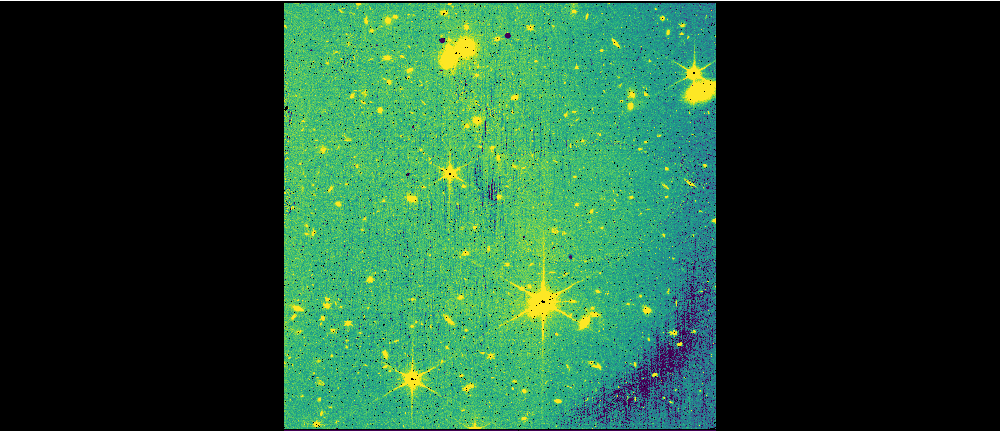

In [16]:
Image('./rate_science.png')

***
## <a id='image2'>3. Stage 2 Processing </a>

In the [Image2 stage of the pipeline](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_image2.html), calibrated unrectified data products are created (`*_cal.fits` or `*_calints.fits` files, depending on whether the input files are `*_rate.fits` or `*_rateints.fits`). 

In this pipeline processing stage, the [world coordinate system (WCS)](https://jwst-pipeline.readthedocs.io/en/latest/jwst/assign_wcs/index.html#assign-wcs-step) is assigned, the data are [flat fielded](https://jwst-pipeline.readthedocs.io/en/latest/jwst/flatfield/index.html#flatfield-step), and a [photometric calibration](https://jwst-pipeline.readthedocs.io/en/latest/jwst/photom/index.html#photom-step) is applied to convert from units of countrate (ADU/s) to surface brightness (MJy/sr). 

By default, the [background subtraction step](https://jwst-pipeline.readthedocs.io/en/latest/jwst/background_step/index.html#background-step) and the [resampling step](https://jwst-pipeline.readthedocs.io/en/latest/jwst/resample/index.html#resample-step) are turned off for NIRISS at this stage of the pipeline. The background subtraction is turned off since there is no background template for the imaging mode and the local background is removed during the background correction for photometric measurements around individual sources. The resampling step occurs during the `Image3` stage by default. While the resampling step can be turned on during the `Image2` stage to, e.g.,  generate a source catalog for each image, the data quality from the `Image3` stage will be better since the bad pixels, which adversely affect both the centroids and photometry in individual images, will be mostly removed.

In [17]:
# Define directory to save output from Image2
image2_dir = 'image2/'
# Create directory if it does not exist
if not os.path.isdir(image2_dir):
    os.mkdir(image2_dir)

# Run Image2 stage of pipeline, specifying:
# output directory to save *_cal.fits files
# save_results flag set to True so the rate files are saved

for rate in rate_files:
    cal_result = Image2Pipeline.call(rate,
                                     output_dir=image2_dir,
                                     save_results=True)

2024-09-23 16:45:45,774 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf    1.2 K bytes  (1 / 1 files) (0 / 1.2 K bytes)


2024-09-23 16:45:46,135 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:45:46,146 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-09-23 16:45:46,482 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:45:46,498 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:45:46,499 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:45:46,500 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:45:46,502 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:45:46,503 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:45:46,505 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:45:46,660 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00001_nis_rate.fits',).


2024-09-23 16:45:46,668 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:45:46,717 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:45:46,720 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits   16.8 M bytes  (1 / 5 files) (0 / 83.9 M bytes)


2024-09-23 16:45:48,016 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf    9.9 K bytes  (2 / 5 files) (16.8 M / 83.9 M bytes)


2024-09-23 16:45:48,267 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf    5.4 K bytes  (3 / 5 files) (16.8 M / 83.9 M bytes)


2024-09-23 16:45:48,601 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits   67.1 M bytes  (4 / 5 files) (16.8 M / 83.9 M bytes)


2024-09-23 16:45:50,981 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits   11.5 K bytes  (5 / 5 files) (83.9 M / 83.9 M bytes)


2024-09-23 16:45:51,251 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:45:51,252 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:45:51,252 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:45:51,253 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:45:51,253 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:45:51,254 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:45:51,254 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:45:51,255 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:45:51,255 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:45:51,255 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:45:51,256 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:45:51,256 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:45:51,256 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:45:51,257 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:45:51,258 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:45:51,258 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:45:51,258 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:45:51,259 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:45:51,259 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:45:51,259 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:45:51,260 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:45:51,262 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:45:51,263 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00001_nis


2024-09-23 16:45:51,263 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00001_nis_rate.fits ...


2024-09-23 16:45:51,466 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00001_nis_image2pipeline.fits>,).


2024-09-23 16:45:51,658 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:45:51,727 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.741854239 -26.792479051 303.782502890 -26.783393014 303.772199160 -26.747414924 303.731588611 -26.756482660


2024-09-23 16:45:51,728 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.741854239 -26.792479051 303.782502890 -26.783393014 303.772199160 -26.747414924 303.731588611 -26.756482660


2024-09-23 16:45:51,728 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:45:51,789 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:45:51,947 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00001_nis_image2pipeline.fits>,).


2024-09-23 16:45:52,032 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:45:52,033 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:45:52,033 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:45:52,034 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:45:52,208 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:45:52,364 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00001_nis_image2pipeline.fits>,).


2024-09-23 16:45:52,388 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:45:52,389 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:45:52,441 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:45:52,441 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:45:52,442 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:45:52,442 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:45:52,443 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:45:52,477 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:45:52,477 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:45:52,479 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:45:52,520 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:45:52,677 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00001_nis_image2pipeline.fits>,).


2024-09-23 16:45:52,677 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:45:52,679 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00001_nis


2024-09-23 16:45:52,680 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:45:52,681 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:45:52,910 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00001_nis_cal.fits


2024-09-23 16:45:52,911 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:45:52,911 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:45:52,967 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:45:52,977 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:45:52,989 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:45:52,990 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:45:52,992 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:45:52,993 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:45:52,994 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:45:52,996 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:45:53,155 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00002_nis_rate.fits',).


2024-09-23 16:45:53,163 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:45:53,212 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:45:53,215 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:45:53,215 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:45:53,216 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:45:53,216 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:45:53,217 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:45:53,218 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:45:53,218 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:45:53,219 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:45:53,220 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:45:53,221 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:45:53,222 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:45:53,222 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:45:53,223 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:45:53,223 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:45:53,224 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:45:53,225 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:45:53,225 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:45:53,226 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:45:53,227 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:45:53,227 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:45:53,228 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:45:53,229 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:45:53,231 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00002_nis


2024-09-23 16:45:53,231 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00002_nis_rate.fits ...


2024-09-23 16:45:53,445 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00002_nis_image2pipeline.fits>,).


2024-09-23 16:45:53,624 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:45:53,681 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.738214137 -26.798033307 303.778865034 -26.788948185 303.768561815 -26.752969863 303.727949025 -26.762036684


2024-09-23 16:45:53,682 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.738214137 -26.798033307 303.778865034 -26.788948185 303.768561815 -26.752969863 303.727949025 -26.762036684


2024-09-23 16:45:53,683 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:45:53,743 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:45:53,901 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00002_nis_image2pipeline.fits>,).


2024-09-23 16:45:53,983 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:45:53,984 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:45:53,985 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:45:53,985 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:45:54,151 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:45:54,309 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00002_nis_image2pipeline.fits>,).


2024-09-23 16:45:54,333 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:45:54,333 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:45:54,384 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:45:54,385 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:45:54,385 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:45:54,386 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:45:54,387 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:45:54,413 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:45:54,414 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:45:54,415 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:45:54,456 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:45:54,620 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00002_nis_image2pipeline.fits>,).


2024-09-23 16:45:54,621 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:45:54,622 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00002_nis


2024-09-23 16:45:54,623 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:45:54,624 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:45:54,859 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00002_nis_cal.fits


2024-09-23 16:45:54,859 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:45:54,860 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:45:54,912 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:45:54,922 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:45:54,934 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:45:54,935 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:45:54,936 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:45:54,937 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:45:54,938 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:45:54,940 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:45:55,099 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00003_nis_rate.fits',).


2024-09-23 16:45:55,108 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:45:55,158 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:45:55,161 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:45:55,162 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:45:55,162 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:45:55,162 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:45:55,164 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:45:55,164 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:45:55,165 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:45:55,165 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:45:55,166 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:45:55,167 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:45:55,167 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:45:55,168 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:45:55,168 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:45:55,169 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:45:55,171 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:45:55,171 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:45:55,172 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:45:55,172 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:45:55,173 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:45:55,173 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:45:55,174 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:45:55,175 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:45:55,176 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00003_nis


2024-09-23 16:45:55,176 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00003_nis_rate.fits ...


2024-09-23 16:45:55,389 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00003_nis_image2pipeline.fits>,).


2024-09-23 16:45:55,567 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:45:55,631 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.748076235 -26.795728135 303.788725488 -26.786640096 303.778419241 -26.750662514 303.737808091 -26.759732249


2024-09-23 16:45:55,632 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.748076235 -26.795728135 303.788725488 -26.786640096 303.778419241 -26.750662514 303.737808091 -26.759732249


2024-09-23 16:45:55,632 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:45:55,684 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:45:55,848 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00003_nis_image2pipeline.fits>,).


2024-09-23 16:45:55,930 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:45:55,931 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:45:55,931 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:45:55,932 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:45:56,086 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:45:56,246 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00003_nis_image2pipeline.fits>,).


2024-09-23 16:45:56,270 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:45:56,271 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:45:56,323 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:45:56,323 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:45:56,324 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:45:56,325 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:45:56,325 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:45:56,351 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:45:56,352 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:45:56,353 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:45:56,395 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:45:56,555 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00003_nis_image2pipeline.fits>,).


2024-09-23 16:45:56,556 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:45:56,558 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00003_nis


2024-09-23 16:45:56,559 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:45:56,560 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:45:56,794 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00003_nis_cal.fits


2024-09-23 16:45:56,795 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:45:56,795 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:45:56,847 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:45:56,857 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:45:56,869 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:45:56,870 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:45:56,871 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:45:56,873 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:45:56,874 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:45:56,876 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:45:57,039 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00004_nis_rate.fits',).


2024-09-23 16:45:57,047 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:45:57,096 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:45:57,100 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:45:57,100 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:45:57,101 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:45:57,101 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:45:57,102 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:45:57,103 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:45:57,104 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:45:57,104 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:45:57,105 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:45:57,106 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:45:57,106 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:45:57,107 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:45:57,107 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:45:57,108 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:45:57,108 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:45:57,109 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:45:57,111 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:45:57,111 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:45:57,112 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:45:57,112 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:45:57,113 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:45:57,114 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:45:57,115 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00004_nis


2024-09-23 16:45:57,115 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00004_nis_rate.fits ...


2024-09-23 16:45:57,324 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00004_nis_image2pipeline.fits>,).


2024-09-23 16:45:57,501 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:45:57,566 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.745493505 -26.786924996 303.786139823 -26.777837735 303.775835240 -26.741859955 303.735227018 -26.750928915


2024-09-23 16:45:57,567 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.745493505 -26.786924996 303.786139823 -26.777837735 303.775835240 -26.741859955 303.735227018 -26.750928915


2024-09-23 16:45:57,567 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:45:57,618 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:45:57,779 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00004_nis_image2pipeline.fits>,).


2024-09-23 16:45:57,865 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:45:57,866 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:45:57,866 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:45:57,867 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:45:58,028 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:45:58,190 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00004_nis_image2pipeline.fits>,).


2024-09-23 16:45:58,214 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:45:58,214 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:45:58,263 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:45:58,264 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:45:58,264 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:45:58,265 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:45:58,265 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:45:58,292 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:45:58,292 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:45:58,294 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:45:58,340 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:45:58,501 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00004_nis_image2pipeline.fits>,).


2024-09-23 16:45:58,502 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:45:58,503 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00004_nis


2024-09-23 16:45:58,505 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:45:58,505 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:45:58,738 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00004_nis_cal.fits


2024-09-23 16:45:58,738 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:45:58,739 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:45:58,796 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:45:58,805 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:45:58,817 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:45:58,818 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:45:58,820 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:45:58,821 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:45:58,823 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:45:58,824 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:45:58,987 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00005_nis_rate.fits',).


2024-09-23 16:45:58,995 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:45:59,044 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00005_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:45:59,048 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:45:59,048 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:45:59,049 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:45:59,049 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:45:59,049 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:45:59,050 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:45:59,050 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:45:59,051 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:45:59,053 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:45:59,054 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:45:59,054 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:45:59,055 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:45:59,055 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:45:59,056 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:45:59,056 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:45:59,057 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:45:59,057 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:45:59,058 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:45:59,058 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:45:59,059 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:45:59,059 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:45:59,061 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:45:59,061 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00005_nis


2024-09-23 16:45:59,062 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00005_nis_rate.fits ...


2024-09-23 16:45:59,269 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00005_nis_image2pipeline.fits>,).


2024-09-23 16:45:59,446 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:45:59,507 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.735631928 -26.789230123 303.776279861 -26.780145676 303.765978192 -26.744167183 303.725368360 -26.753233330


2024-09-23 16:45:59,508 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.735631928 -26.789230123 303.776279861 -26.780145676 303.765978192 -26.744167183 303.725368360 -26.753233330


2024-09-23 16:45:59,508 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:45:59,559 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:45:59,725 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00005_nis_image2pipeline.fits>,).


2024-09-23 16:45:59,812 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:45:59,812 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:45:59,813 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:45:59,813 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:45:59,973 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:00,139 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00005_nis_image2pipeline.fits>,).


2024-09-23 16:46:00,163 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:00,163 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:00,213 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:00,213 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:00,214 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:00,214 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:00,215 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:00,241 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:00,241 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:00,243 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:00,285 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:00,449 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00005_nis_image2pipeline.fits>,).


2024-09-23 16:46:00,449 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:00,451 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00005_nis


2024-09-23 16:46:00,452 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:00,452 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:00,692 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00005_nis_cal.fits


2024-09-23 16:46:00,693 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:00,693 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:00,745 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:00,755 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:00,767 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:00,768 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:00,770 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:00,771 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:00,772 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:00,774 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:00,940 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00006_nis_rate.fits',).


2024-09-23 16:46:00,948 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:00,997 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00006_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:01,000 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:01,000 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:01,001 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:01,001 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:01,002 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:01,003 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:01,004 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:01,004 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:01,005 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:01,006 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:01,006 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:01,007 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:01,007 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:01,008 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:01,009 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:01,011 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:01,011 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:01,012 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:01,012 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:01,013 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:01,013 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:01,014 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:01,015 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00006_nis


2024-09-23 16:46:01,016 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00006_nis_rate.fits ...


2024-09-23 16:46:01,228 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00006_nis_image2pipeline.fits>,).


2024-09-23 16:46:01,410 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:01,468 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.736922794 -26.793631848 303.777572181 -26.784546967 303.767269630 -26.748568584 303.726658346 -26.757635166


2024-09-23 16:46:01,469 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.736922794 -26.793631848 303.777572181 -26.784546967 303.767269630 -26.748568584 303.726658346 -26.757635166


2024-09-23 16:46:01,469 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:01,530 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:01,704 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00006_nis_image2pipeline.fits>,).


2024-09-23 16:46:01,786 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:01,787 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:01,787 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:01,788 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:01,952 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:02,118 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00006_nis_image2pipeline.fits>,).


2024-09-23 16:46:02,149 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:02,149 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:02,205 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:02,206 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:02,206 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:02,207 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:02,208 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:02,237 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:02,237 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:02,239 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:02,280 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:02,441 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00006_nis_image2pipeline.fits>,).


2024-09-23 16:46:02,442 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:02,444 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00006_nis


2024-09-23 16:46:02,444 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:02,445 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:02,675 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00006_nis_cal.fits


2024-09-23 16:46:02,676 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:02,676 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:02,728 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:02,737 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:02,749 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:02,750 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:02,752 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:02,753 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:02,754 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:02,756 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:02,921 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00007_nis_rate.fits',).


2024-09-23 16:46:02,929 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:02,978 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00007_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:02,981 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:02,982 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:02,982 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:02,983 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:02,983 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:02,984 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:02,984 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:02,985 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:02,986 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:02,986 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:02,987 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:02,987 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:02,988 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:02,989 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:02,990 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:02,990 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:02,991 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:02,991 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:02,992 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:02,992 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:02,992 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:02,994 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:02,995 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00007_nis


2024-09-23 16:46:02,995 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00007_nis_rate.fits ...


2024-09-23 16:46:03,204 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00007_nis_image2pipeline.fits>,).


2024-09-23 16:46:03,381 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:03,443 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.743144738 -26.796881330 303.783794840 -26.787794847 303.773490215 -26.751816871 303.732878218 -26.760885052


2024-09-23 16:46:03,444 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.743144738 -26.796881330 303.783794840 -26.787794847 303.773490215 -26.751816871 303.732878218 -26.760885052


2024-09-23 16:46:03,444 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:03,495 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:03,656 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00007_nis_image2pipeline.fits>,).


2024-09-23 16:46:03,739 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:03,739 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:03,740 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:03,740 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:03,896 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:04,062 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00007_nis_image2pipeline.fits>,).


2024-09-23 16:46:04,086 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:04,087 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:04,143 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:04,144 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:04,145 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:04,145 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:04,146 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:04,171 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:04,172 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:04,174 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:04,214 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:04,380 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00007_nis_image2pipeline.fits>,).


2024-09-23 16:46:04,380 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:04,382 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00007_nis


2024-09-23 16:46:04,383 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:04,383 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:04,617 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00007_nis_cal.fits


2024-09-23 16:46:04,618 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:04,618 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:04,672 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:04,682 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:04,693 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:04,695 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:04,696 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:04,698 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:04,699 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:04,700 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:04,868 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00008_nis_rate.fits',).


2024-09-23 16:46:04,876 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:04,925 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00008_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:04,928 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:04,929 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:04,929 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:04,930 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:04,931 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:04,931 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:04,932 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:04,933 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:04,933 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:04,934 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:04,935 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:04,935 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:04,935 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:04,936 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:04,936 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:04,937 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:04,938 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:04,939 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:04,939 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:04,940 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:04,940 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:04,941 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:04,942 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00008_nis


2024-09-23 16:46:04,942 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00008_nis_rate.fits ...


2024-09-23 16:46:05,158 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00008_nis_image2pipeline.fits>,).


2024-09-23 16:46:05,335 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:05,394 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.746784872 -26.791326555 303.787432662 -26.782238924 303.777127267 -26.746261238 303.736517577 -26.755330567


2024-09-23 16:46:05,395 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.746784872 -26.791326555 303.787432662 -26.782238924 303.777127267 -26.746261238 303.736517577 -26.755330567


2024-09-23 16:46:05,396 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:05,455 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:05,633 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00008_nis_image2pipeline.fits>,).


2024-09-23 16:46:05,716 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:05,716 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:05,717 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:05,717 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:05,872 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:06,038 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00008_nis_image2pipeline.fits>,).


2024-09-23 16:46:06,062 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:06,062 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:06,119 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:06,119 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:06,120 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:06,120 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:06,120 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:06,147 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:06,148 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:06,149 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:06,190 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:06,360 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00008_nis_image2pipeline.fits>,).


2024-09-23 16:46:06,361 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:06,363 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00008_nis


2024-09-23 16:46:06,363 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:06,364 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:06,594 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00008_nis_cal.fits


2024-09-23 16:46:06,595 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:06,595 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:06,656 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:06,665 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:06,677 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:06,678 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:06,680 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:06,681 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:06,682 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:06,684 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:06,851 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00009_nis_rate.fits',).


2024-09-23 16:46:06,859 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:06,913 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00009_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:06,916 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:06,916 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:06,917 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:06,918 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:06,918 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:06,919 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:06,919 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:06,920 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:06,920 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:06,921 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:06,922 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:06,922 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:06,923 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:06,923 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:06,924 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:06,925 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:06,926 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:06,926 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:06,928 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:06,928 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:06,929 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:06,930 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:06,931 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00009_nis


2024-09-23 16:46:06,931 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00009_nis_rate.fits ...


2024-09-23 16:46:07,153 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00009_nis_image2pipeline.fits>,).


2024-09-23 16:46:07,331 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:07,392 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.740562612 -26.788077734 303.781209713 -26.778991797 303.770906496 -26.743013682 303.730297492 -26.752081318


2024-09-23 16:46:07,393 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.740562612 -26.788077734 303.781209713 -26.778991797 303.770906496 -26.743013682 303.730297492 -26.752081318


2024-09-23 16:46:07,393 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:07,454 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:07,639 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00009_nis_image2pipeline.fits>,).


2024-09-23 16:46:07,722 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:07,722 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:07,723 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:07,723 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:07,876 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:08,041 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00009_nis_image2pipeline.fits>,).


2024-09-23 16:46:08,066 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:08,066 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:08,119 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:08,119 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:08,120 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:08,120 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:08,121 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:08,148 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:08,148 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:08,149 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:08,190 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:08,356 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00009_nis_image2pipeline.fits>,).


2024-09-23 16:46:08,357 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:08,358 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00009_nis


2024-09-23 16:46:08,359 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:08,360 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:08,590 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00009_nis_cal.fits


2024-09-23 16:46:08,590 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:08,592 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:08,649 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:08,659 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:08,674 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:08,675 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:08,677 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:08,678 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:08,679 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:08,681 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:08,845 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00010_nis_rate.fits',).


2024-09-23 16:46:08,853 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:08,907 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00010_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:08,910 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:08,911 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:08,912 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:08,912 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:08,913 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:08,913 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:08,914 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:08,914 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:08,915 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:08,915 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:08,916 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:08,916 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:08,916 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:08,918 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:08,919 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:08,919 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:08,919 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:08,920 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:08,921 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:08,921 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:08,922 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:08,923 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:08,924 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00010_nis


2024-09-23 16:46:08,924 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00010_nis_rate.fits ...


2024-09-23 16:46:09,139 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00010_nis_image2pipeline.fits>,).


2024-09-23 16:46:09,317 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:09,376 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.738742913 -26.790854726 303.779391177 -26.781769388 303.769088372 -26.745791122 303.728478209 -26.754858159


2024-09-23 16:46:09,377 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.738742913 -26.790854726 303.779391177 -26.781769388 303.769088372 -26.745791122 303.728478209 -26.754858159


2024-09-23 16:46:09,377 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:09,428 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:09,596 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00010_nis_image2pipeline.fits>,).


2024-09-23 16:46:09,686 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:09,687 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:09,687 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:09,687 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:09,851 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:10,026 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00010_nis_image2pipeline.fits>,).


2024-09-23 16:46:10,050 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:10,051 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:10,100 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:10,101 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:10,101 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:10,102 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:10,103 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:10,129 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:10,130 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:10,131 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:10,173 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:10,347 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00010_nis_image2pipeline.fits>,).


2024-09-23 16:46:10,348 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:10,349 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00010_nis


2024-09-23 16:46:10,350 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:10,351 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:10,581 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00010_nis_cal.fits


2024-09-23 16:46:10,582 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:10,582 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:10,640 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:10,650 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:10,663 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:10,664 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:10,666 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:10,667 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:10,669 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:10,670 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:10,840 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00011_nis_rate.fits',).


2024-09-23 16:46:10,848 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:10,898 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00011_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:10,901 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:10,902 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:10,902 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:10,903 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:10,904 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:10,904 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:10,905 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:10,905 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:10,906 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:10,906 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:10,907 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:10,907 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:10,908 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:10,908 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:10,909 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:10,909 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:10,910 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:10,910 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:10,912 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:10,912 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:10,913 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:10,914 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:10,914 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00011_nis


2024-09-23 16:46:10,915 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00011_nis_rate.fits ...


2024-09-23 16:46:11,146 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00011_nis_image2pipeline.fits>,).


2024-09-23 16:46:11,379 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:11,440 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.740034198 -26.795256243 303.780683961 -26.786170628 303.770380447 -26.750192432 303.729768789 -26.759259746


2024-09-23 16:46:11,441 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.740034198 -26.795256243 303.780683961 -26.786170628 303.770380447 -26.750192432 303.729768789 -26.759259746


2024-09-23 16:46:11,442 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:11,492 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:11,663 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00011_nis_image2pipeline.fits>,).


2024-09-23 16:46:11,754 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:11,755 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:11,755 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:11,756 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:11,911 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:12,083 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00011_nis_image2pipeline.fits>,).


2024-09-23 16:46:12,107 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:12,107 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:12,160 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:12,160 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:12,161 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:12,161 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:12,162 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:12,188 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:12,189 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:12,190 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:12,231 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:12,405 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00011_nis_image2pipeline.fits>,).


2024-09-23 16:46:12,405 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:12,407 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00011_nis


2024-09-23 16:46:12,408 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:12,408 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:12,639 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00011_nis_cal.fits


2024-09-23 16:46:12,640 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:12,640 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:12,694 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:12,704 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:12,716 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:12,717 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:12,718 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:12,720 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:12,721 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:12,722 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:12,893 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00012_nis_rate.fits',).


2024-09-23 16:46:12,901 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:12,951 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00012_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:12,955 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:12,955 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:12,956 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:12,956 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:12,957 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:12,957 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:12,958 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:12,958 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:12,960 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:12,960 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:12,961 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:12,961 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:12,962 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:12,962 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:12,963 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:12,963 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:12,964 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:12,964 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:12,965 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:12,965 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:12,966 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:12,967 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:12,967 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00012_nis


2024-09-23 16:46:12,968 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00012_nis_rate.fits ...


2024-09-23 16:46:13,192 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00012_nis_image2pipeline.fits>,).


2024-09-23 16:46:13,376 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:13,438 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.744965132 -26.794103704 303.785614069 -26.785016615 303.775309024 -26.749038793 303.734698191 -26.758107579


2024-09-23 16:46:13,439 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.744965132 -26.794103704 303.785614069 -26.785016615 303.775309024 -26.749038793 303.734698191 -26.758107579


2024-09-23 16:46:13,439 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:13,490 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:13,654 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00012_nis_image2pipeline.fits>,).


2024-09-23 16:46:13,737 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:13,738 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:13,738 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:13,739 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:13,895 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:14,064 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00012_nis_image2pipeline.fits>,).


2024-09-23 16:46:14,088 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:14,088 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:14,144 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:14,145 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:14,145 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:14,146 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:14,146 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:14,172 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:14,172 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:14,174 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:14,221 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:14,389 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00012_nis_image2pipeline.fits>,).


2024-09-23 16:46:14,389 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:14,391 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00012_nis


2024-09-23 16:46:14,392 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:14,392 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:14,626 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00012_nis_cal.fits


2024-09-23 16:46:14,627 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:14,627 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:14,687 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:14,698 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:14,711 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:14,713 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:14,714 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:14,715 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:14,717 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:14,718 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:14,895 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00013_nis_rate.fits',).


2024-09-23 16:46:14,903 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:14,954 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00013_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:14,958 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:14,959 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:14,959 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:14,959 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:14,960 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:14,960 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:14,961 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:14,962 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:14,963 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:14,963 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:14,964 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:14,964 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:14,965 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:14,966 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:14,966 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:14,967 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:14,967 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:14,969 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:14,969 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:14,970 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:14,971 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:14,972 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:14,973 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00013_nis


2024-09-23 16:46:14,974 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00013_nis_rate.fits ...


2024-09-23 16:46:15,200 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00013_nis_image2pipeline.fits>,).


2024-09-23 16:46:15,385 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:15,451 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.743673743 -26.789702172 303.784321194 -26.780615409 303.774016911 -26.744637504 303.733407559 -26.753705966


2024-09-23 16:46:15,452 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.743673743 -26.789702172 303.784321194 -26.780615409 303.774016911 -26.744637504 303.733407559 -26.753705966


2024-09-23 16:46:15,453 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:15,513 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:15,684 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00013_nis_image2pipeline.fits>,).


2024-09-23 16:46:15,768 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:15,768 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:15,769 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:15,770 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:15,941 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:16,120 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00013_nis_image2pipeline.fits>,).


2024-09-23 16:46:16,144 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:16,145 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:16,194 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:16,195 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:16,195 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:16,196 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:16,196 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:16,223 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:16,223 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:16,225 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:16,271 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:16,442 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00013_nis_image2pipeline.fits>,).


2024-09-23 16:46:16,443 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:16,444 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00013_nis


2024-09-23 16:46:16,445 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:16,446 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:16,683 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00013_nis_cal.fits


2024-09-23 16:46:16,684 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:16,685 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:16,738 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:16,748 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:16,760 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:16,761 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:16,762 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:16,764 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:16,765 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:16,767 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:16,935 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00014_nis_rate.fits',).


2024-09-23 16:46:16,943 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:16,992 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00014_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:16,995 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:16,996 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:16,996 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:16,997 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:16,997 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:16,997 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:16,998 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:16,998 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:16,999 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:16,999 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:17,000 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:17,000 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:17,001 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:17,001 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:17,002 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:17,002 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:17,003 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:17,003 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:17,004 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:17,004 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:17,005 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:17,006 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:17,006 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00014_nis


2024-09-23 16:46:17,007 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00014_nis_rate.fits ...


2024-09-23 16:46:17,236 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00014_nis_image2pipeline.fits>,).


2024-09-23 16:46:17,413 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:17,476 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.741208296 -26.790278517 303.781856145 -26.781192440 303.771552571 -26.745214361 303.730942822 -26.754282137


2024-09-23 16:46:17,477 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.741208296 -26.790278517 303.781856145 -26.781192440 303.771552571 -26.745214361 303.730942822 -26.754282137


2024-09-23 16:46:17,477 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:17,537 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:17,723 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00014_nis_image2pipeline.fits>,).


2024-09-23 16:46:17,806 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:17,807 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:17,807 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:17,808 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:17,967 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:18,144 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00014_nis_image2pipeline.fits>,).


2024-09-23 16:46:18,168 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:18,168 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:18,217 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:18,218 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:18,218 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:18,218 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:18,219 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:18,245 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:18,246 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:18,247 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:18,289 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:18,462 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00014_nis_image2pipeline.fits>,).


2024-09-23 16:46:18,462 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:18,464 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00014_nis


2024-09-23 16:46:18,465 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:18,466 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:18,696 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00014_nis_cal.fits


2024-09-23 16:46:18,696 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:18,697 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:18,750 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:18,759 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:18,771 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:18,772 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:18,773 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:18,775 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:18,776 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:18,777 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:18,947 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00015_nis_rate.fits',).


2024-09-23 16:46:18,954 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:19,003 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00015_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:19,007 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:19,007 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:19,008 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:19,008 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:19,009 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:19,009 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:19,010 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:19,011 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:19,012 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:19,012 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:19,013 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:19,013 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:19,014 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:19,015 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:19,015 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:19,016 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:19,017 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:19,018 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:19,018 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:19,019 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:19,019 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:19,020 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:19,021 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00015_nis


2024-09-23 16:46:19,021 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00015_nis_rate.fits ...


2024-09-23 16:46:19,254 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00015_nis_image2pipeline.fits>,).


2024-09-23 16:46:19,430 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:19,488 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.739388537 -26.793055529 303.780037545 -26.783970036 303.769734367 -26.747991809 303.729123462 -26.757059002


2024-09-23 16:46:19,489 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.739388537 -26.793055529 303.780037545 -26.783970036 303.769734367 -26.747991809 303.729123462 -26.757059002


2024-09-23 16:46:19,489 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:19,550 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:19,737 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00015_nis_image2pipeline.fits>,).


2024-09-23 16:46:19,826 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:19,827 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:19,827 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:19,828 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:19,981 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:20,155 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00015_nis_image2pipeline.fits>,).


2024-09-23 16:46:20,179 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:20,179 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:20,229 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:20,229 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:20,230 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:20,231 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:20,231 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:20,257 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:20,258 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:20,259 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:20,300 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:20,469 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00015_nis_image2pipeline.fits>,).


2024-09-23 16:46:20,469 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:20,471 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00015_nis


2024-09-23 16:46:20,471 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:20,473 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:20,702 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00015_nis_cal.fits


2024-09-23 16:46:20,703 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:20,703 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:20,760 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:20,770 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:20,781 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:20,782 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:20,784 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:20,785 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:20,786 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:20,788 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:20,953 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00016_nis_rate.fits',).


2024-09-23 16:46:20,960 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:21,010 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00016_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:21,013 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:21,014 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:21,014 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:21,015 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:21,015 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:21,016 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:21,017 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:21,017 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:21,018 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:21,018 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:21,019 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:21,020 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:21,020 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:21,020 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:21,021 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:21,021 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:21,022 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:21,022 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:21,023 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:21,024 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:21,025 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:21,026 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:21,026 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00016_nis


2024-09-23 16:46:21,027 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00016_nis_rate.fits ...


2024-09-23 16:46:21,246 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00016_nis_image2pipeline.fits>,).


2024-09-23 16:46:21,423 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:21,485 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.742499665 -26.794680027 303.783149008 -26.785593654 303.772844705 -26.749615651 303.732233466 -26.758683722


2024-09-23 16:46:21,486 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.742499665 -26.794680027 303.783149008 -26.785593654 303.772844705 -26.749615651 303.732233466 -26.758683722


2024-09-23 16:46:21,487 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:21,547 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:21,727 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00016_nis_image2pipeline.fits>,).


2024-09-23 16:46:21,810 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:21,810 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:21,811 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:21,811 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:21,969 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:22,143 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00016_nis_image2pipeline.fits>,).


2024-09-23 16:46:22,167 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:22,168 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:22,220 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:22,221 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:22,221 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:22,222 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:22,222 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:22,249 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:22,249 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:22,250 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:22,291 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:22,457 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00016_nis_image2pipeline.fits>,).


2024-09-23 16:46:22,458 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:22,459 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00016_nis


2024-09-23 16:46:22,460 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:22,460 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:22,690 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00016_nis_cal.fits


2024-09-23 16:46:22,691 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:22,691 - stpipe - INFO - Results used jwst version: 1.16.0


2024-09-23 16:46:22,744 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:22,754 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-09-23 16:46:22,766 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-09-23 16:46:22,767 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-09-23 16:46:22,768 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-09-23 16:46:22,770 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-09-23 16:46:22,771 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-09-23 16:46:22,773 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:22,941 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('detector1/jw01475006001_02201_00017_nis_rate.fits',).


2024-09-23 16:46:22,948 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image2/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
 

2024-09-23 16:46:22,997 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00017_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-09-23 16:46:23,000 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-09-23 16:46:23,001 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-09-23 16:46:23,001 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-09-23 16:46:23,002 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-09-23 16:46:23,002 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-09-23 16:46:23,003 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-09-23 16:46:23,004 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-09-23 16:46:23,004 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-09-23 16:46:23,005 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-09-23 16:46:23,005 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-09-23 16:46:23,006 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-09-23 16:46:23,007 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-09-23 16:46:23,007 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-09-23 16:46:23,009 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-09-23 16:46:23,009 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-09-23 16:46:23,010 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-09-23 16:46:23,011 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-09-23 16:46:23,011 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-09-23 16:46:23,012 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-09-23 16:46:23,012 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-09-23 16:46:23,013 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-09-23 16:46:23,014 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-09-23 16:46:23,014 - stpipe.Image2Pipeline - INFO - Processing product detector1/jw01475006001_02201_00017_nis


2024-09-23 16:46:23,015 - stpipe.Image2Pipeline - INFO - Working on input detector1/jw01475006001_02201_00017_nis_rate.fits ...


2024-09-23 16:46:23,235 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00017_nis_image2pipeline.fits>,).


2024-09-23 16:46:23,417 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-09-23 16:46:23,480 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  303.744319371 -26.791902974 303.784967553 -26.782816011 303.774662848 -26.746838158 303.734052767 -26.755906819


2024-09-23 16:46:23,481 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  303.744319371 -26.791902974 303.784967553 -26.782816011 303.774662848 -26.746838158 303.734052767 -26.755906819


2024-09-23 16:46:23,482 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-09-23 16:46:23,542 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-09-23 16:46:23,730 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00017_nis_image2pipeline.fits>,).


2024-09-23 16:46:23,811 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-09-23 16:46:23,812 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-09-23 16:46:23,812 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-09-23 16:46:23,813 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-09-23 16:46:23,966 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-09-23 16:46:24,138 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00017_nis_image2pipeline.fits>,).


2024-09-23 16:46:24,162 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-09-23 16:46:24,162 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-09-23 16:46:24,212 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-09-23 16:46:24,212 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-09-23 16:46:24,213 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-09-23 16:46:24,213 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-09-23 16:46:24,214 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-09-23 16:46:24,240 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-09-23 16:46:24,240 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-09-23 16:46:24,241 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-09-23 16:46:24,282 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-09-23 16:46:24,450 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from image2/jw01475006001_02201_00017_nis_image2pipeline.fits>,).


2024-09-23 16:46:24,451 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-09-23 16:46:24,452 - stpipe.Image2Pipeline - INFO - Finished processing product detector1/jw01475006001_02201_00017_nis


2024-09-23 16:46:24,454 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-09-23 16:46:24,454 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1281.pmap


2024-09-23 16:46:24,686 - stpipe.Image2Pipeline - INFO - Saved model in image2/jw01475006001_02201_00017_nis_cal.fits


2024-09-23 16:46:24,687 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-09-23 16:46:24,687 - stpipe - INFO - Results used jwst version: 1.16.0


### Identify `*_cal.fits` files

In [18]:
cal_files = sorted(glob.glob(os.path.join(image2_dir, '*_cal.fits')))

### Verify which pipeline steps were run

In [19]:
cal_f = datamodels.open(cal_files[0])

cal_f.meta.cal_step.instance

{'assign_wcs': 'COMPLETE',
 'charge_migration': 'COMPLETE',
 'clean_flicker_noise': 'SKIPPED',
 'dark_sub': 'COMPLETE',
 'dq_init': 'COMPLETE',
 'flat_field': 'COMPLETE',
 'gain_scale': 'SKIPPED',
 'group_scale': 'SKIPPED',
 'ipc': 'SKIPPED',
 'jump': 'COMPLETE',
 'linearity': 'COMPLETE',
 'persistence': 'SKIPPED',
 'photom': 'COMPLETE',
 'ramp_fit': 'COMPLETE',
 'refpix': 'COMPLETE',
 'resample': 'SKIPPED',
 'saturation': 'COMPLETE',
 'superbias': 'COMPLETE'}

Check which reference files were used to calibrate the dataset:

In [20]:
cal_f.meta.ref_file.instance

{'area': {'name': 'crds://jwst_niriss_area_0021.fits'},
 'camera': {'name': 'N/A'},
 'collimator': {'name': 'N/A'},
 'crds': {'context_used': 'jwst_1281.pmap', 'sw_version': '11.18.4'},
 'dark': {'name': 'crds://jwst_niriss_dark_0169.fits'},
 'dflat': {'name': 'N/A'},
 'disperser': {'name': 'N/A'},
 'distortion': {'name': 'crds://jwst_niriss_distortion_0047.asdf'},
 'fflat': {'name': 'N/A'},
 'filteroffset': {'name': 'crds://jwst_niriss_filteroffset_0006.asdf'},
 'flat': {'name': 'crds://jwst_niriss_flat_0282.fits'},
 'fore': {'name': 'N/A'},
 'fpa': {'name': 'N/A'},
 'gain': {'name': 'crds://jwst_niriss_gain_0006.fits'},
 'ifufore': {'name': 'N/A'},
 'ifupost': {'name': 'N/A'},
 'ifuslicer': {'name': 'N/A'},
 'linearity': {'name': 'crds://jwst_niriss_linearity_0017.fits'},
 'mask': {'name': 'crds://jwst_niriss_mask_0017.fits'},
 'msa': {'name': 'N/A'},
 'ote': {'name': 'N/A'},
 'photom': {'name': 'crds://jwst_niriss_photom_0043.fits'},
 'readnoise': {'name': 'crds://jwst_niriss_readno

### Display cal image

Visualize a calibrated image, using the dataset from the first dither position as an example.

In [21]:
# Create an Imviz instance and set up default viewer
imviz_cal = Imviz()
viewer_cal = imviz_cal.default_viewer

# Read in the science array for our visualization dataset:
cal_science = cal_f.data

# Load the dataset into Imviz
imviz_cal.load_data(cal_science)

# Visualize the dataset:
imviz_cal.show()

Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.3/imviz/index.html', events=['ca…

In [22]:
plotopt = imviz_cal.plugins['Plot Options']
plotopt.stretch_function = 'sqrt'
plotopt.image_colormap = 'Viridis'
plotopt.stretch_preset = '95%'
plotopt.zoom_radius = 1024

The viewer looks like this:

In [23]:
viewer_cal.save('./cal_science.png')

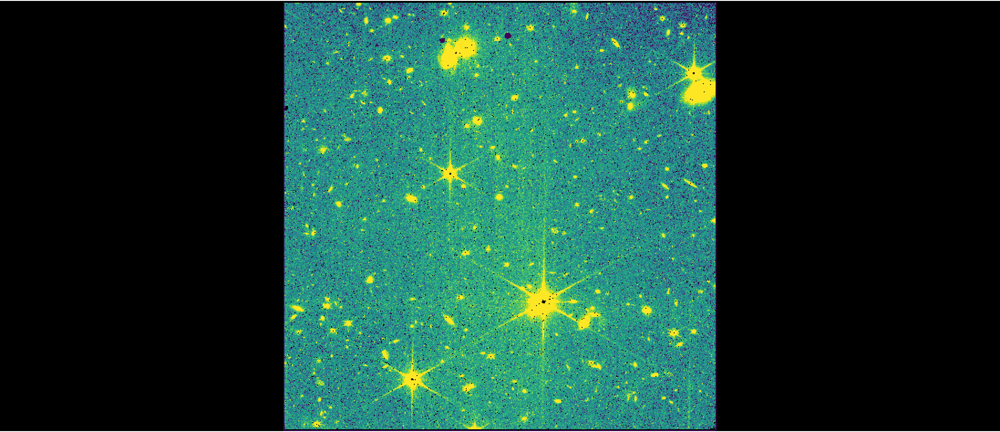

In [24]:
Image('./cal_science.png')

***
## <a id='image3'>3. Stage 3 Processing </a>

In the [Image3 stage of the pipeline](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_image3.html), the individual `*_cal.fits` files for each of the dither positions are combined to one single distortion corrected image. First, an [Association](https://jwst-pipeline.readthedocs.io/en/latest/jwst/associations/overview.html) needs to be created to inform the pipeline that these individual exposures are linked together. 

By default, the `Image3` stage of the pipeline performs the following steps on NIRISS data: 
- [tweakreg](https://jwst-pipeline.readthedocs.io/en/latest/jwst/tweakreg/index.html#tweakreg-step) - creates source catalogs of pointlike sources for each input image. The source catalog for each input image is compared to each other to derive coordinate transforms to align the images relative to each other.
   - As of CRDS context `jwst_1156.pmap` and later, the `pars-tweakreg` parameter reference file for NIRISS performs an absolute astrometric correction to GAIA data release 3 by default (i.e., the `abs_refcat` parameter is set to `GAIADR3`). Though this default correction generally improves results compared with not doing this alignment, it can sometimes result in poor performance in crowded or sparse fields, so users are encouraged to check astrometric accuracy and revisit this step if necessary.
   - As of pipeline version 1.12.5, the default source finding algorithm is `DAOStarFinder` which can result in up to 0.5 pix uncertainties in the centroids for undersampled PSFs, like the NIRISS PSFs at short wavelengths [(Goudfrooij 2022)](https://www.stsci.edu/files/live/sites/www/files/home/jwst/documentation/technical-documents/_documents/JWST-STScI-008116.pdf). There are plans to update the default algorithm to `IRAFStarFinder` in future pipeline versions.
- [skymatch](https://jwst-pipeline.readthedocs.io/en/latest/jwst/skymatch/index.html#skymatch-step) - measures the background level from the sky to use as input into the subsequent `outlier detection` and `resample` steps.
- [outlier detection](https://jwst-pipeline.readthedocs.io/en/latest/jwst/outlier_detection/index.html#outlier-detection-step) - flags any remaining cosmic rays, bad pixels, or other artifacts not already flagged during the `DETECTOR1` stage of the pipeline, using all input images to create a median image so that outliers in individual images can be identified.
- [resample](https://jwst-pipeline.readthedocs.io/en/latest/jwst/resample/index.html#resample-step) - resamples each input image based on its WCS and distortion information and creates a single undistorted image.
- [source catalog](https://jwst-pipeline.readthedocs.io/en/latest/jwst/source_catalog/index.html#source-catalog-step) - creates a catalog of detected sources along with measured photometries and morphologies (i.e., point-like vs extended). Useful for quicklooks, but optimization is likely needed for specific science cases, which is an on-going investigation for the NIRISS team. Users may wish to experiment with changing the `snr_threshold` and `deblend` options. Modifications to the following parameters will not significantly improve data quality and it is advised to keep them at their default values: `aperture_ee1`, `aperture_ee2`, `aperture_ee3`, `ci1_star_threshold`, `ci2_star_threshold`.


### Create Association File

An association file lists the exposures to calibrated together in `Stage 3` of the pipeline. Note that an association file is available for download from MAST, with a filename of `*_asn.json`. Here we show how to create an association file to point to the data products created when processing data through the pipeline. Note that the output products will have a rootname that is specified by the `product_name` in the association file. For this tutorial, the rootname of the output products will be `image3_association`.

In [25]:
# Create a Level 3 Association
associations = asn_from_list.asn_from_list(cal_files, 
                                           rule=DMS_Level3_Base, 
                                           product_name='image3_association')

associations.data['asn_type'] = 'image3'
associations.data['program'] = pid

# Format association as .json file
asn_filename, serialized = associations.dump(format="json")

# Write out association file
with open(asn_filename, "w") as fd:
    fd.write(serialized)

2024-09-23 16:46:25,713 - stpipe - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



### Run Image3 stage of the pipeline

Given the grouped exposures in the association file, the `Image3` stage of the pipeline will produce:
- a `*_cr.fits` file produced by the `outlier_detection` step, where the `DQ` array marks the pixels flagged as outliers.
- a final combined, rectified image with name `*_i2d.fits`,
- a source catalog with name `*_cat.ecsv`,
- a segmentation map file (`*_segm.fits`) which has integer values at the pixel locations where a source is detected where the pixel values match the source ID number in the catalog.

In [26]:
# Define directory to save output from Image2
image3_dir = 'image3/'
# Create directory if it does not exist
if not os.path.isdir(image3_dir):
    os.mkdir(image3_dir)

# Run Stage 3
i2d_result = Image3Pipeline.call(asn_filename, 
                                 output_dir=image3_dir,
                                 save_results=True)

2024-09-23 16:46:25,879 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0079.asdf    1.7 K bytes  (1 / 1 files) (0 / 1.7 K bytes)


2024-09-23 16:46:26,147 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0079.asdf


2024-09-23 16:46:26,159 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf    5.3 K bytes  (1 / 1 files) (0 / 5.3 K bytes)


2024-09-23 16:46:26,429 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf


2024-09-23 16:46:26,443 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-09-23 16:46:26,452 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-09-23 16:46:26,716 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf


2024-09-23 16:46:26,738 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-09-23 16:46:26,739 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-09-23 16:46:26,742 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-09-23 16:46:26,744 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-09-23 16:46:26,746 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-09-23 16:46:26,747 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-09-23 16:46:26,749 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-09-23 16:46:26,931 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw01475-a3001_image3_00019_asn.json',).


2024-09-23 16:46:26,944 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: image3/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False
      

2024-09-23 16:46:26,957 - stpipe.Image3Pipeline - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-09-23 16:46:27,093 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw01475006001_02201_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr']


2024-09-23 16:46:27,096 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf    2.1 K bytes  (1 / 2 files) (0 / 16.5 K bytes)


2024-09-23 16:46:27,367 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits   14.4 K bytes  (2 / 2 files) (2.1 K / 16.5 K bytes)


2024-09-23 16:46:27,689 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-09-23 16:46:27,690 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-09-23 16:46:27,691 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-09-23 16:46:27,700 - stpipe.Image3Pipeline - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-09-23 16:46:28,236 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f1d12b50250>,).


2024-09-23 16:46:29,661 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00001_nis_cal.fits.


2024-09-23 16:46:31,303 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00002_nis_cal.fits.


2024-09-23 16:46:32,948 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00003_nis_cal.fits.


2024-09-23 16:46:34,586 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00004_nis_cal.fits.


2024-09-23 16:46:36,220 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00005_nis_cal.fits.


2024-09-23 16:46:37,863 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00006_nis_cal.fits.


2024-09-23 16:46:39,498 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00007_nis_cal.fits.


2024-09-23 16:46:41,134 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00008_nis_cal.fits.


2024-09-23 16:46:42,795 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00009_nis_cal.fits.


2024-09-23 16:46:44,444 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00010_nis_cal.fits.


2024-09-23 16:46:46,301 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00011_nis_cal.fits.


2024-09-23 16:46:47,979 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00012_nis_cal.fits.


2024-09-23 16:46:49,619 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00013_nis_cal.fits.


2024-09-23 16:46:51,233 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00014_nis_cal.fits.


2024-09-23 16:46:52,866 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00015_nis_cal.fits.


2024-09-23 16:46:54,520 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00016_nis_cal.fits.


2024-09-23 16:46:56,168 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw01475006001_02201_00017_nis_cal.fits.


2024-09-23 16:46:56,195 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:46:56,196 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 17.


2024-09-23 16:46:56,196 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:46:56,197 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-09-23 16:46:56.196775


2024-09-23 16:46:56,197 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.8


2024-09-23 16:46:56,198 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:47:16,434 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw01475006001_02201_17' as reference image


2024-09-23 16:47:16,440 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_12' to the reference catalog.


2024-09-23 16:47:16,489 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00012_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00017_nis_cal' catalog.


2024-09-23 16:47:16,490 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:16,491 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05024, 0.049 (arcsec) with significance of 48.83 and 53 matches.


2024-09-23 16:47:16,493 - stpipe.Image3Pipeline.tweakreg - INFO - Found 52 matches for 'GROUP ID: jw01475006001_02201_12'...


2024-09-23 16:47:16,493 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:16,496 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_12:


2024-09-23 16:47:16,497 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00297273  YSH: -0.00187108    ROT: -0.000591114    SCALE: 1


2024-09-23 16:47:16,497 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:16,498 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00789271   FIT MAE: 0.00615887


2024-09-23 16:47:16,498 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 50 objects.


2024-09-23 16:47:16,543 - stpipe.Image3Pipeline.tweakreg - INFO - Added 48 unmatched sources from 'GROUP ID: jw01475006001_02201_12' to the reference catalog.


2024-09-23 16:47:18,602 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_8' to the reference catalog.


2024-09-23 16:47:18,655 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00008_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00012_nis_cal' catalog.


2024-09-23 16:47:18,655 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:18,657 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 43.82 and 50 matches.


2024-09-23 16:47:18,658 - stpipe.Image3Pipeline.tweakreg - INFO - Found 48 matches for 'GROUP ID: jw01475006001_02201_8'...


2024-09-23 16:47:18,659 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:18,661 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_8:


2024-09-23 16:47:18,662 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00164925  YSH: -0.00369618    ROT: 0.0011737    SCALE: 1


2024-09-23 16:47:18,662 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:18,663 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.01276   FIT MAE: 0.0076927


2024-09-23 16:47:18,663 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 45 objects.


2024-09-23 16:47:18,708 - stpipe.Image3Pipeline.tweakreg - INFO - Added 52 unmatched sources from 'GROUP ID: jw01475006001_02201_8' to the reference catalog.


2024-09-23 16:47:20,581 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_13' to the reference catalog.


2024-09-23 16:47:20,635 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00013_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00008_nis_cal' catalog.


2024-09-23 16:47:20,635 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:20,637 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04796, 0.04692 (arcsec) with significance of 51.17 and 63 matches.


2024-09-23 16:47:20,638 - stpipe.Image3Pipeline.tweakreg - INFO - Found 58 matches for 'GROUP ID: jw01475006001_02201_13'...


2024-09-23 16:47:20,639 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:20,642 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_13:


2024-09-23 16:47:20,642 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00303404  YSH: -0.00194698    ROT: 7.34316e-05    SCALE: 1


2024-09-23 16:47:20,643 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:20,643 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00929328   FIT MAE: 0.00667297


2024-09-23 16:47:20,644 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 56 objects.


2024-09-23 16:47:20,689 - stpipe.Image3Pipeline.tweakreg - INFO - Added 42 unmatched sources from 'GROUP ID: jw01475006001_02201_13' to the reference catalog.


2024-09-23 16:47:22,762 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_14' to the reference catalog.


2024-09-23 16:47:22,812 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00014_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00013_nis_cal' catalog.


2024-09-23 16:47:22,813 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:22,814 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04707, 0.05382 (arcsec) with significance of 52.42 and 68 matches.


2024-09-23 16:47:22,816 - stpipe.Image3Pipeline.tweakreg - INFO - Found 56 matches for 'GROUP ID: jw01475006001_02201_14'...


2024-09-23 16:47:22,816 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:22,820 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_14:


2024-09-23 16:47:22,820 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0122021  YSH: 0.00041192    ROT: -0.00193315    SCALE: 1


2024-09-23 16:47:22,821 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:22,821 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0626783   FIT MAE: 0.0179162


2024-09-23 16:47:22,822 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 54 objects.


2024-09-23 16:47:22,886 - stpipe.Image3Pipeline.tweakreg - INFO - Added 44 unmatched sources from 'GROUP ID: jw01475006001_02201_14' to the reference catalog.


2024-09-23 16:47:24,734 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_16' to the reference catalog.


2024-09-23 16:47:24,787 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00016_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00014_nis_cal' catalog.


2024-09-23 16:47:24,788 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:24,790 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05087, 0.04619 (arcsec) with significance of 55.78 and 70 matches.


2024-09-23 16:47:24,791 - stpipe.Image3Pipeline.tweakreg - INFO - Found 62 matches for 'GROUP ID: jw01475006001_02201_16'...


2024-09-23 16:47:24,792 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:24,795 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_16:


2024-09-23 16:47:24,795 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00592855  YSH: -0.000195081    ROT: -0.000676598    SCALE: 1


2024-09-23 16:47:24,796 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:24,796 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0157021   FIT MAE: 0.00707357


2024-09-23 16:47:24,798 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 59 objects.


2024-09-23 16:47:24,859 - stpipe.Image3Pipeline.tweakreg - INFO - Added 38 unmatched sources from 'GROUP ID: jw01475006001_02201_16' to the reference catalog.


2024-09-23 16:47:26,742 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_11' to the reference catalog.


2024-09-23 16:47:27,046 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00011_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00016_nis_cal' catalog.


2024-09-23 16:47:27,047 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:27,048 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 58.13 and 70 matches.


2024-09-23 16:47:27,049 - stpipe.Image3Pipeline.tweakreg - INFO - Found 63 matches for 'GROUP ID: jw01475006001_02201_11'...


2024-09-23 16:47:27,050 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:27,053 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_11:


2024-09-23 16:47:27,053 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00958002  YSH: 0.00354008    ROT: 0.0104241    SCALE: 1


2024-09-23 16:47:27,054 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:27,054 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.062213   FIT MAE: 0.0205152


2024-09-23 16:47:27,055 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 60 objects.


2024-09-23 16:47:27,118 - stpipe.Image3Pipeline.tweakreg - INFO - Added 37 unmatched sources from 'GROUP ID: jw01475006001_02201_11' to the reference catalog.


2024-09-23 16:47:29,031 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_10' to the reference catalog.


2024-09-23 16:47:29,081 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00010_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00011_nis_cal' catalog.


2024-09-23 16:47:29,082 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:29,084 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.05155 (arcsec) with significance of 49.16 and 77 matches.


2024-09-23 16:47:29,085 - stpipe.Image3Pipeline.tweakreg - INFO - Found 67 matches for 'GROUP ID: jw01475006001_02201_10'...


2024-09-23 16:47:29,086 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:29,088 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_10:


2024-09-23 16:47:29,089 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00464647  YSH: 0.000554522    ROT: 0.000197908    SCALE: 1


2024-09-23 16:47:29,089 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:29,090 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0107048   FIT MAE: 0.0082514


2024-09-23 16:47:29,090 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 66 objects.


2024-09-23 16:47:29,152 - stpipe.Image3Pipeline.tweakreg - INFO - Added 33 unmatched sources from 'GROUP ID: jw01475006001_02201_10' to the reference catalog.


2024-09-23 16:47:30,836 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_15' to the reference catalog.


2024-09-23 16:47:30,890 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00015_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00010_nis_cal' catalog.


2024-09-23 16:47:30,890 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:30,892 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.02334, -0.03547 (arcsec) with significance of 55.49 and 80 matches.


2024-09-23 16:47:30,893 - stpipe.Image3Pipeline.tweakreg - INFO - Found 65 matches for 'GROUP ID: jw01475006001_02201_15'...


2024-09-23 16:47:30,894 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:30,897 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_15:


2024-09-23 16:47:30,897 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00598402  YSH: 0.00242701    ROT: -0.00091101    SCALE: 1


2024-09-23 16:47:30,898 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:30,899 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0575169   FIT MAE: 0.0172465


2024-09-23 16:47:30,899 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 62 objects.


2024-09-23 16:47:30,962 - stpipe.Image3Pipeline.tweakreg - INFO - Added 35 unmatched sources from 'GROUP ID: jw01475006001_02201_15' to the reference catalog.


2024-09-23 16:47:32,467 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_1' to the reference catalog.


2024-09-23 16:47:32,522 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00001_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00015_nis_cal' catalog.


2024-09-23 16:47:32,522 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:32,524 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04976, 0.04595 (arcsec) with significance of 57.75 and 86 matches.


2024-09-23 16:47:32,525 - stpipe.Image3Pipeline.tweakreg - INFO - Found 65 matches for 'GROUP ID: jw01475006001_02201_1'...


2024-09-23 16:47:32,526 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:32,529 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_1:


2024-09-23 16:47:32,529 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00215817  YSH: 0.000376617    ROT: -0.000540888    SCALE: 1


2024-09-23 16:47:32,529 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:32,530 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00783033   FIT MAE: 0.00654007


2024-09-23 16:47:32,531 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 63 objects.


2024-09-23 16:47:32,594 - stpipe.Image3Pipeline.tweakreg - INFO - Added 35 unmatched sources from 'GROUP ID: jw01475006001_02201_1' to the reference catalog.


2024-09-23 16:47:33,943 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_9' to the reference catalog.


2024-09-23 16:47:33,996 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00009_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00001_nis_cal' catalog.


2024-09-23 16:47:33,996 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:33,998 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04984, 0.04816 (arcsec) with significance of 50.91 and 78 matches.


2024-09-23 16:47:34,000 - stpipe.Image3Pipeline.tweakreg - INFO - Found 59 matches for 'GROUP ID: jw01475006001_02201_9'...


2024-09-23 16:47:34,000 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:34,003 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_9:


2024-09-23 16:47:34,003 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00529789  YSH: -0.0018275    ROT: -0.00100167    SCALE: 1


2024-09-23 16:47:34,003 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:34,004 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00772268   FIT MAE: 0.00650076


2024-09-23 16:47:34,004 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 57 objects.


2024-09-23 16:47:34,068 - stpipe.Image3Pipeline.tweakreg - INFO - Added 41 unmatched sources from 'GROUP ID: jw01475006001_02201_9' to the reference catalog.


2024-09-23 16:47:35,371 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_4' to the reference catalog.


2024-09-23 16:47:35,424 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00004_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00009_nis_cal' catalog.


2024-09-23 16:47:35,424 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:35,426 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.04975 (arcsec) with significance of 59.63 and 87 matches.


2024-09-23 16:47:35,428 - stpipe.Image3Pipeline.tweakreg - INFO - Found 62 matches for 'GROUP ID: jw01475006001_02201_4'...


2024-09-23 16:47:35,429 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:35,432 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_4:


2024-09-23 16:47:35,432 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00574765  YSH: 0.000846227    ROT: -0.0092664    SCALE: 1


2024-09-23 16:47:35,433 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:35,433 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0612653   FIT MAE: 0.020322


2024-09-23 16:47:35,434 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 60 objects.


2024-09-23 16:47:35,499 - stpipe.Image3Pipeline.tweakreg - INFO - Added 38 unmatched sources from 'GROUP ID: jw01475006001_02201_4' to the reference catalog.


2024-09-23 16:47:36,529 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_5' to the reference catalog.


2024-09-23 16:47:36,580 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00005_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00004_nis_cal' catalog.


2024-09-23 16:47:36,581 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:36,582 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.049 (arcsec) with significance of 55.76 and 94 matches.


2024-09-23 16:47:36,584 - stpipe.Image3Pipeline.tweakreg - INFO - Found 59 matches for 'GROUP ID: jw01475006001_02201_5'...


2024-09-23 16:47:36,585 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:36,588 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_5:


2024-09-23 16:47:36,588 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0125868  YSH: 0.00303293    ROT: -0.00240757    SCALE: 1


2024-09-23 16:47:36,588 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:36,589 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0651953   FIT MAE: 0.0191239


2024-09-23 16:47:36,590 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 56 objects.


2024-09-23 16:47:36,653 - stpipe.Image3Pipeline.tweakreg - INFO - Added 41 unmatched sources from 'GROUP ID: jw01475006001_02201_5' to the reference catalog.


2024-09-23 16:47:37,346 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_6' to the reference catalog.


2024-09-23 16:47:37,398 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00006_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00005_nis_cal' catalog.


2024-09-23 16:47:37,398 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:37,400 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.0477, 0.04965 (arcsec) with significance of 68.6 and 101 matches.


2024-09-23 16:47:37,401 - stpipe.Image3Pipeline.tweakreg - INFO - Found 64 matches for 'GROUP ID: jw01475006001_02201_6'...


2024-09-23 16:47:37,402 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:37,404 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_6:


2024-09-23 16:47:37,405 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -5.64577e-07  YSH: 0.00570035    ROT: 0.000500578    SCALE: 1


2024-09-23 16:47:37,405 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:37,406 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.00778831   FIT MAE: 0.00590413


2024-09-23 16:47:37,406 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 60 objects.


2024-09-23 16:47:37,469 - stpipe.Image3Pipeline.tweakreg - INFO - Added 36 unmatched sources from 'GROUP ID: jw01475006001_02201_6' to the reference catalog.


2024-09-23 16:47:37,984 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_2' to the reference catalog.


2024-09-23 16:47:38,035 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00002_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00006_nis_cal' catalog.


2024-09-23 16:47:38,035 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:38,037 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04767, 0.03219 (arcsec) with significance of 58.68 and 103 matches.


2024-09-23 16:47:38,038 - stpipe.Image3Pipeline.tweakreg - INFO - Found 69 matches for 'GROUP ID: jw01475006001_02201_2'...


2024-09-23 16:47:38,039 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:38,042 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_2:


2024-09-23 16:47:38,042 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00427682  YSH: 0.00472328    ROT: 0.00121112    SCALE: 1


2024-09-23 16:47:38,043 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:38,044 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0588941   FIT MAE: 0.0159931


2024-09-23 16:47:38,044 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 66 objects.


2024-09-23 16:47:38,108 - stpipe.Image3Pipeline.tweakreg - INFO - Added 31 unmatched sources from 'GROUP ID: jw01475006001_02201_2' to the reference catalog.


2024-09-23 16:47:38,435 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_3' to the reference catalog.


2024-09-23 16:47:38,488 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00003_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00002_nis_cal' catalog.


2024-09-23 16:47:38,488 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:38,490 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05121, 0.04605 (arcsec) with significance of 41.57 and 89 matches.


2024-09-23 16:47:38,491 - stpipe.Image3Pipeline.tweakreg - INFO - Found 52 matches for 'GROUP ID: jw01475006001_02201_3'...


2024-09-23 16:47:38,492 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:38,495 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_3:


2024-09-23 16:47:38,495 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00295282  YSH: -0.00595903    ROT: 0.000161523    SCALE: 1


2024-09-23 16:47:38,496 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:38,497 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0696149   FIT MAE: 0.0210842


2024-09-23 16:47:38,497 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 50 objects.


2024-09-23 16:47:38,561 - stpipe.Image3Pipeline.tweakreg - INFO - Added 48 unmatched sources from 'GROUP ID: jw01475006001_02201_3' to the reference catalog.


2024-09-23 16:47:38,708 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw01475006001_02201_7' to the reference catalog.


2024-09-23 16:47:38,759 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_00007_nis_cal' catalog with sources from the reference 'jw01475006001_02201_00003_nis_cal' catalog.


2024-09-23 16:47:38,759 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:47:38,761 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.07161, 0.01078 (arcsec) with significance of 52.26 and 103 matches.


2024-09-23 16:47:38,762 - stpipe.Image3Pipeline.tweakreg - INFO - Found 65 matches for 'GROUP ID: jw01475006001_02201_7'...


2024-09-23 16:47:38,763 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-09-23 16:47:38,766 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw01475006001_02201_7:


2024-09-23 16:47:38,766 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00894993  YSH: 0.00463131    ROT: -0.0028708    SCALE: 1


2024-09-23 16:47:38,767 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-09-23 16:47:38,767 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0940692   FIT MAE: 0.023655


2024-09-23 16:47:38,768 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 60 objects.


2024-09-23 16:47:38,814 - stpipe.Image3Pipeline.tweakreg - INFO - Added 36 unmatched sources from 'GROUP ID: jw01475006001_02201_7' to the reference catalog.


2024-09-23 16:47:38,815 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:47:38,815 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-09-23 16:47:38.815029


2024-09-23 16:47:38,816 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:42.618254


2024-09-23 16:47:38,816 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:47:40,019 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:47:40,020 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-09-23 16:47:40.019608


2024-09-23 16:47:40,020 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.8


2024-09-23 16:47:40,021 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:49:31,145 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: 987654' to the reference catalog.


2024-09-23 16:49:31,204 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw01475006001_02201_000' catalog with sources from the reference 'Unnamed' catalog.


2024-09-23 16:49:31,204 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-09-23 16:49:31,207 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.1692, 0.002131 (arcsec) with significance of 10.44 and 31 matches.


2024-09-23 16:49:31,209 - stpipe.Image3Pipeline.tweakreg - INFO - Found 13 matches for 'GROUP ID: 987654'...


2024-09-23 16:49:31,209 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough matches (< 13) found for image catalog 'GROUP ID: 987654'.


2024-09-23 16:49:31,210 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:49:31,211 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-09-23 16:49:31.210687


2024-09-23 16:49:31,211 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:01:51.191079


2024-09-23 16:49:31,212 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-09-23 16:49:31,226 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-09-23 16:49:31,535 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f1d12b50250>,).


2024-09-23 16:49:31,867 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-09-23 16:49:31,867 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-09-23 16:49:31.867131


2024-09-23 16:49:31,868 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-09-23 16:49:31,868 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-09-23 16:49:31,869 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-09-23 16:49:31,869 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-09-23 16:49:31,870 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-09-23 16:49:31,871 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-09-23 16:51:43,130 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00001_nis_cal.fits. Sky background: 0.000777844


2024-09-23 16:51:43,131 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00002_nis_cal.fits. Sky background: 0


2024-09-23 16:51:43,131 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00003_nis_cal.fits. Sky background: 0.00194414


2024-09-23 16:51:43,132 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00004_nis_cal.fits. Sky background: 0.00261598


2024-09-23 16:51:43,132 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00005_nis_cal.fits. Sky background: 0.00184969


2024-09-23 16:51:43,133 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00006_nis_cal.fits. Sky background: 0.00106297


2024-09-23 16:51:43,134 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00007_nis_cal.fits. Sky background: 0.000463979


2024-09-23 16:51:43,134 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00008_nis_cal.fits. Sky background: 0.00158776


2024-09-23 16:51:43,135 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00009_nis_cal.fits. Sky background: 0.00102022


2024-09-23 16:51:43,136 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00010_nis_cal.fits. Sky background: 0.00180598


2024-09-23 16:51:43,136 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00011_nis_cal.fits. Sky background: 0.000597871


2024-09-23 16:51:43,137 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00012_nis_cal.fits. Sky background: 0.000848144


2024-09-23 16:51:43,137 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00013_nis_cal.fits. Sky background: 0.00153453


2024-09-23 16:51:43,138 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00014_nis_cal.fits. Sky background: 0.00252335


2024-09-23 16:51:43,139 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00015_nis_cal.fits. Sky background: 0.000937484


2024-09-23 16:51:43,139 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00016_nis_cal.fits. Sky background: 0.00180074


2024-09-23 16:51:43,140 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw01475006001_02201_00017_nis_cal.fits. Sky background: 0.00180182


2024-09-23 16:51:43,141 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-09-23 16:51:43,142 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-09-23 16:51:43.141877


2024-09-23 16:51:43,143 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:02:11.274746


2024-09-23 16:51:43,143 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-09-23 16:51:43,178 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-09-23 16:51:43,443 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f1d12b50250>,).


2024-09-23 16:51:43,444 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection mode: imaging


2024-09-23 16:51:43,445 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection asn_id: a3001


2024-09-23 16:51:43,446 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-09-23 16:51:43,447 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-09-23 16:51:43,448 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-09-23 16:51:43,448 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-09-23 16:51:43,449 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-09-23 16:51:43,586 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556276592712629 arcsec.


2024-09-23 16:51:43,639 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:51:45,743 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:51:46,708 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00001_nis_a3001_outlier_i2d.fits


2024-09-23 16:51:46,717 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:51:48,688 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:51:49,657 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00002_nis_a3001_outlier_i2d.fits


2024-09-23 16:51:49,666 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:51:51,626 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:51:52,608 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00003_nis_a3001_outlier_i2d.fits


2024-09-23 16:51:52,616 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:51:54,538 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:51:55,513 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00004_nis_a3001_outlier_i2d.fits


2024-09-23 16:51:55,522 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:51:57,466 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:51:58,434 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00005_nis_a3001_outlier_i2d.fits


2024-09-23 16:51:58,442 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:00,373 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:01,349 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00006_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:01,358 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:03,308 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:04,282 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00007_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:04,290 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:06,242 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:07,219 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00008_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:07,228 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:09,318 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:10,287 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00009_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:10,296 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:12,294 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:13,262 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00010_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:13,271 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:15,244 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:16,211 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00011_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:16,225 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:18,195 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:19,166 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00012_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:19,174 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:21,138 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:22,114 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00013_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:22,124 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:24,130 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:25,136 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00014_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:25,145 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:27,150 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:28,140 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00015_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:28,149 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:30,105 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:31,073 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00016_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:31,082 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-09-23 16:52:33,070 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:52:34,040 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00017_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:34,046 - stpipe.Image3Pipeline.outlier_detection - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-09-23 16:52:53,229 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00001_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,243 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00002_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,257 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00003_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,271 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00004_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,285 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00005_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,299 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00006_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,313 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00007_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,327 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00008_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,341 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00009_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,355 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00010_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,369 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00011_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,383 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00012_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,399 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00013_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,416 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00014_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,433 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00015_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,450 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00016_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:53,467 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file image3/jw01475006001_02201_00017_nis_a3001_outlier_i2d.fits


2024-09-23 16:52:55,394 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:52:55,648 - stpipe.Image3Pipeline.outlier_detection - INFO - 4019 pixels marked as outliers


2024-09-23 16:52:57,591 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:52:57,847 - stpipe.Image3Pipeline.outlier_detection - INFO - 3771 pixels marked as outliers


2024-09-23 16:52:59,772 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:00,024 - stpipe.Image3Pipeline.outlier_detection - INFO - 3756 pixels marked as outliers


2024-09-23 16:53:01,955 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:02,206 - stpipe.Image3Pipeline.outlier_detection - INFO - 4370 pixels marked as outliers


2024-09-23 16:53:04,149 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:04,402 - stpipe.Image3Pipeline.outlier_detection - INFO - 4129 pixels marked as outliers


2024-09-23 16:53:06,379 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:06,637 - stpipe.Image3Pipeline.outlier_detection - INFO - 3899 pixels marked as outliers


2024-09-23 16:53:08,628 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:08,887 - stpipe.Image3Pipeline.outlier_detection - INFO - 3671 pixels marked as outliers


2024-09-23 16:53:10,870 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:11,132 - stpipe.Image3Pipeline.outlier_detection - INFO - 4070 pixels marked as outliers


2024-09-23 16:53:13,076 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:13,329 - stpipe.Image3Pipeline.outlier_detection - INFO - 3982 pixels marked as outliers


2024-09-23 16:53:15,306 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:15,555 - stpipe.Image3Pipeline.outlier_detection - INFO - 4062 pixels marked as outliers


2024-09-23 16:53:17,497 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:17,746 - stpipe.Image3Pipeline.outlier_detection - INFO - 4205 pixels marked as outliers


2024-09-23 16:53:19,686 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:19,940 - stpipe.Image3Pipeline.outlier_detection - INFO - 3822 pixels marked as outliers


2024-09-23 16:53:21,906 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:22,160 - stpipe.Image3Pipeline.outlier_detection - INFO - 3900 pixels marked as outliers


2024-09-23 16:53:24,121 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:24,379 - stpipe.Image3Pipeline.outlier_detection - INFO - 4087 pixels marked as outliers


2024-09-23 16:53:26,337 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:26,597 - stpipe.Image3Pipeline.outlier_detection - INFO - 4027 pixels marked as outliers


2024-09-23 16:53:28,544 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:28,796 - stpipe.Image3Pipeline.outlier_detection - INFO - 3969 pixels marked as outliers


2024-09-23 16:53:30,718 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2568, 2545)


2024-09-23 16:53:30,968 - stpipe.Image3Pipeline.outlier_detection - INFO - 3917 pixels marked as outliers


2024-09-23 16:53:31,241 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00001_nis_a3001_crf.fits


2024-09-23 16:53:31,467 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00002_nis_a3001_crf.fits


2024-09-23 16:53:31,700 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00003_nis_a3001_crf.fits


2024-09-23 16:53:31,925 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00004_nis_a3001_crf.fits


2024-09-23 16:53:32,152 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00005_nis_a3001_crf.fits


2024-09-23 16:53:32,380 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00006_nis_a3001_crf.fits


2024-09-23 16:53:32,615 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00007_nis_a3001_crf.fits


2024-09-23 16:53:32,842 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00008_nis_a3001_crf.fits


2024-09-23 16:53:33,069 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00009_nis_a3001_crf.fits


2024-09-23 16:53:33,305 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00010_nis_a3001_crf.fits


2024-09-23 16:53:33,533 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00011_nis_a3001_crf.fits


2024-09-23 16:53:33,773 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00012_nis_a3001_crf.fits


2024-09-23 16:53:34,243 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00013_nis_a3001_crf.fits


2024-09-23 16:53:34,472 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00014_nis_a3001_crf.fits


2024-09-23 16:53:34,697 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00015_nis_a3001_crf.fits


2024-09-23 16:53:34,926 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00016_nis_a3001_crf.fits


2024-09-23 16:53:35,151 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in image3/jw01475006001_02201_00017_nis_a3001_crf.fits


2024-09-23 16:53:35,152 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-09-23 16:53:35,367 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f1d12b50250>,).


2024-09-23 16:53:35,826 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-09-23 16:53:35,826 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-09-23 16:53:35,827 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-09-23 16:53:35,828 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-09-23 16:53:35,828 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-09-23 16:53:35,968 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556276592712629 arcsec.


2024-09-23 16:53:36,031 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-09-23 16:53:37,973 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:53:40,771 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:53:43,580 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:53:46,361 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:53:49,156 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:53:51,968 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:53:54,749 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:53:57,529 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:00,328 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:03,112 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:05,901 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:08,706 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:11,502 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:14,297 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:17,055 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:19,850 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:22,649 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:23,895 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-09-23 16:54:25,816 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:28,640 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:31,424 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:34,210 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:37,033 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:39,824 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:42,584 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:45,384 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:48,202 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:50,987 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:53,784 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:56,569 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:54:59,446 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:02,382 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:05,202 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:08,059 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:10,847 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:13,635 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:16,429 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:19,225 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:22,023 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:24,812 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:27,653 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:30,412 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:33,182 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:35,971 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:38,762 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:41,539 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:44,346 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:47,113 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:49,953 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:52,762 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:55,539 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:55:58,308 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:01,111 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:03,928 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:06,698 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:09,517 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:12,322 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:15,127 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:17,950 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:20,713 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:23,532 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:26,314 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:29,078 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:31,860 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:34,671 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:37,448 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:40,237 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:43,023 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:45,800 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2568, 2545)


2024-09-23 16:56:46,764 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  303.737924213 -26.798107375 303.788749306 -26.786752702 303.776138546 -26.741791949 303.725332311 -26.753142128


2024-09-23 16:56:47,318 - stpipe.Image3Pipeline.resample - INFO - Saved model in image3/image3_association_i2d.fits


2024-09-23 16:56:47,319 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-09-23 16:56:47,590 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2568, 2545) from image3_association_i2d.fits>,).


2024-09-23 16:56:47,605 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-09-23 16:56:47,613 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-09-23 16:56:47,613 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-09-23 16:56:47,614 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-09-23 16:56:47,615 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-09-23 16:56:47,615 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F150W


2024-09-23 16:56:47,616 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-09-23 16:56:47,659 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.19753


2024-09-23 16:56:52,116 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 2389 sources


2024-09-23 16:56:53,691 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: image3/image3_association_cat.ecsv


2024-09-23 16:56:53,832 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in image3/image3_association_segm.fits


2024-09-23 16:56:53,833 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: image3_association_segm.fits


2024-09-23 16:56:53,835 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-09-23 16:56:53,840 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-09-23 16:56:53,841 - stpipe - INFO - Results used jwst version: 1.16.0


### Verify which pipeline steps were run

In [27]:
# Identify *_i2d file and open as datamodel
i2d = glob.glob(os.path.join(image3_dir, "*_i2d.fits"))[0]
i2d_f = datamodels.open(i2d)

i2d_f.meta.cal_step.instance

{'assign_wcs': 'COMPLETE',
 'charge_migration': 'COMPLETE',
 'clean_flicker_noise': 'SKIPPED',
 'dark_sub': 'COMPLETE',
 'dq_init': 'COMPLETE',
 'flat_field': 'COMPLETE',
 'gain_scale': 'SKIPPED',
 'group_scale': 'SKIPPED',
 'ipc': 'SKIPPED',
 'jump': 'COMPLETE',
 'linearity': 'COMPLETE',
 'outlier_detection': 'COMPLETE',
 'persistence': 'SKIPPED',
 'photom': 'COMPLETE',
 'ramp_fit': 'COMPLETE',
 'refpix': 'COMPLETE',
 'resample': 'COMPLETE',
 'saturation': 'COMPLETE',
 'skymatch': 'COMPLETE',
 'superbias': 'COMPLETE',
 'tweakreg': 'COMPLETE'}

Check which reference files were used to calibrate the dataset:

In [28]:
i2d_f.meta.ref_file.instance

{'area': {'name': 'crds://jwst_niriss_area_0021.fits'},
 'camera': {'name': 'N/A'},
 'collimator': {'name': 'N/A'},
 'crds': {'context_used': 'jwst_1281.pmap', 'sw_version': '11.18.4'},
 'dark': {'name': 'crds://jwst_niriss_dark_0169.fits'},
 'dflat': {'name': 'N/A'},
 'disperser': {'name': 'N/A'},
 'distortion': {'name': 'crds://jwst_niriss_distortion_0047.asdf'},
 'fflat': {'name': 'N/A'},
 'filteroffset': {'name': 'crds://jwst_niriss_filteroffset_0006.asdf'},
 'flat': {'name': 'crds://jwst_niriss_flat_0282.fits'},
 'fore': {'name': 'N/A'},
 'fpa': {'name': 'N/A'},
 'gain': {'name': 'crds://jwst_niriss_gain_0006.fits'},
 'ifufore': {'name': 'N/A'},
 'ifupost': {'name': 'N/A'},
 'ifuslicer': {'name': 'N/A'},
 'linearity': {'name': 'crds://jwst_niriss_linearity_0017.fits'},
 'mask': {'name': 'crds://jwst_niriss_mask_0017.fits'},
 'msa': {'name': 'N/A'},
 'ote': {'name': 'N/A'},
 'photom': {'name': 'crds://jwst_niriss_photom_0043.fits'},
 'readnoise': {'name': 'crds://jwst_niriss_readno

### Display combined image

Visualize the drizzle-combined image.

In [29]:
# Create an Imviz instance and set up default viewer
imviz_i2d = Imviz()
viewer_i2d = imviz_i2d.default_viewer

# Read in the science array for our visualization dataset:
i2d_science = i2d_f.data

# Load the dataset into Imviz
imviz_i2d.load_data(i2d_science)

# Visualize the dataset:
imviz_i2d.show()

Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.3/imviz/index.html', events=['ca…

In [30]:
plotopt = imviz_i2d.plugins['Plot Options']
plotopt.stretch_function = 'sqrt'
plotopt.image_colormap = 'Viridis'
plotopt.stretch_preset = '95%'
plotopt.zoom_radius = 1024

The viewer looks like this:

In [31]:
viewer_i2d.save('./i2d_science.png')

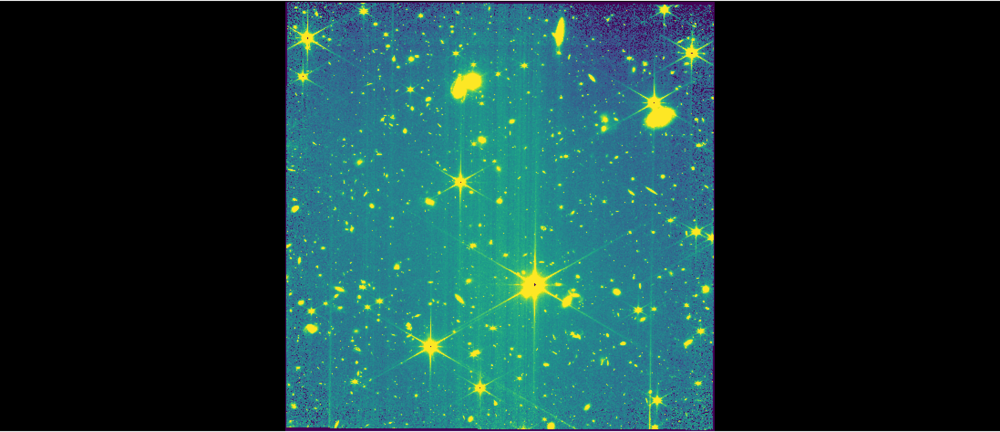

In [32]:
Image('./i2d_science.png')

## <a id='detections'>Visualize Detected Sources</a>
Using the source catalog created by the `IMAGE3` stage of the pipeline, mark the detected sources, using different markers for point sources and extended sources. The source catalog is saved in `image3/image3_association_cat.ecsv` file. We will need to read in the `i2d` file again to make sure the world coordinate system (WCS) info is read in.

### Read in catalog file and identify point/extended sources

In [33]:
catalog_file = glob.glob(os.path.join(image3_dir, "*_cat.ecsv"))[0]
catalog = Table.read(catalog_file)

# To identify point/extended sources, use the 'is_extended' column in the source catalog
pt_src, = np.where(~catalog['is_extended'])
ext_src, = np.where(catalog['is_extended'])

# Define coordinates of point and extended sources
pt_coord = Table({'coord': [SkyCoord(ra=catalog['sky_centroid'][pt_src].ra,
                                     dec=catalog['sky_centroid'][pt_src].dec)]})
ext_coord = Table({'coord': [SkyCoord(ra=catalog['sky_centroid'][ext_src].ra,
                                      dec=catalog['sky_centroid'][ext_src].dec)]})

### Mark the extended and point sources on the image

Display combined image:

In [34]:
# Read in i2d file to Imviz
imviz_cat = Imviz()
viewer_cat = imviz_cat.default_viewer
imviz_cat.load_data(i2d)
imviz_cat.show()

Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.3/imviz/index.html', events=['ca…

In [35]:
# Adjust settings for viewer
plotopt = imviz_cat.plugins['Plot Options']
plotopt.stretch_function = 'sqrt'
plotopt.image_colormap = 'Viridis'
plotopt.stretch_preset = '95%'
plotopt.zoom_radius = 1024

Point sources will be marked by small pink circles and extended sources will be marked by larger white circles.

In [36]:
# Add marker for point sources:
viewer_cat.marker = {'color': 'pink', 'markersize': 50, 'fill': False}

viewer_cat.add_markers(pt_coord, use_skycoord=True, marker_name='point_sources')

# Add marker for extended sources:
viewer_cat.marker = {'color': 'white', 'markersize': 100, 'fill': False}

viewer_cat.add_markers(ext_coord, use_skycoord=True, marker_name='extended_sources')

Viewer looks like this:

In [37]:
viewer_cat.save('./i2d_markers.png')

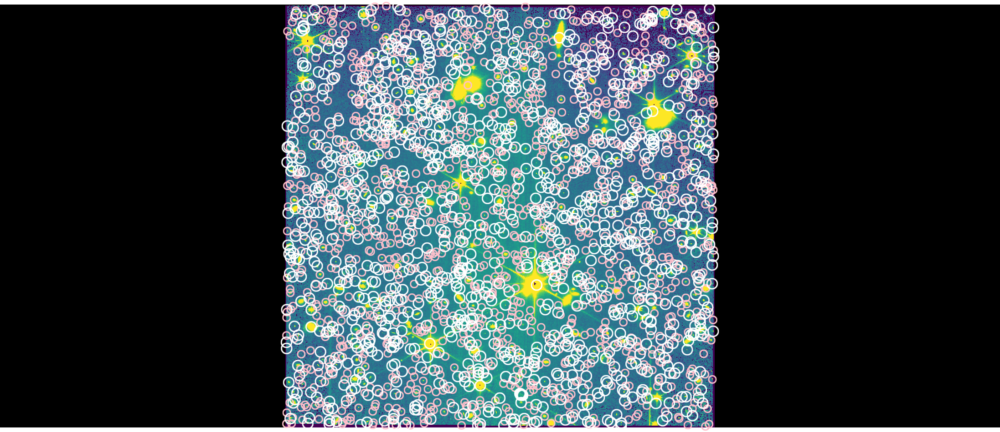

In [38]:
Image('./i2d_markers.png')

From zoooming in on different portions of the image, we can see that some saturated point sources are erroneously labeled as point sources, some extended and saturated objects are not detected, parts of diffraction spikes are sometimes detected as "extended sources", and in some cases, the detected source centroid is offset from the center of a source. It is recommended for users to optimize source detection for their science goals using either their own tools or by updating parameters to the `source_catalog` step of the pipeline.